# **Лабораторная №2 — Сегментация изображений и выделение границ с использованием OpenCV**


# Цель работы
Получить навыки использования классических операторов выделения границ и сегментации изображений с применением библиотеки OpenCV.

# Теоретические сведения



Обработка изображений и компьютерное зрение являются важнейшими направлениями в области современных информационных технологий, робототехники, медицинской диагностики, геоинформационных систем, промышленного контроля качества и различных систем искусственного интеллекта. Одной из ключевых задач компьютерного зрения является **сегментация изображений**, которая представляет собой процесс разделения изображения на части, обладающие определёнными общими свойствами. Как правило, сегментация применяется для выделения объектов интереса или определённых структур изображения для последующего анализа, классификации, измерений или принятия решений.




## Понятие цифрового изображения

Цифровое изображение представляет собой двумерную дискретную функцию:

$$
F(x, y) = f_{ij}
$$

где каждому элементу (пикселю) ставится в соответствие некоторое числовое значение.  
Как правило, изображение представляется в виде матрицы:

$$
F = \begin{bmatrix}
f_{00} & f_{01} & \dots & f_{0,N-1} \\
f_{10} & f_{11} & \dots & f_{1,N-1} \\
\vdots & \vdots & \ddots & \vdots \\
f_{M-1,0} & f_{M-1,1} & \dots & f_{M-1,N-1}
\end{bmatrix}
$$

Для **полутонового изображения** каждый пиксель имеет значение интенсивности в диапазоне [0, 255], где 0 - чёрный, 255 - белый.

Для **цветных изображений** каждый пиксель задаётся вектором:

$$
f_{ij} = (R, G, B)
$$

где компоненты соответствуют интенсивностям красного, зелёного и синего каналов.


**Сегментация изображения** — это процесс разбиения исходного изображения на непересекающиеся области, обладающие однородными признаками. Обозначим множество таких областей:

$$
S = \{S_1, S_2, ..., S_n\}
$$

где выполняются условия:

$$
\bigcup_{k=1}^{n} S_k = F
$$


$$
S_i \cap S_j = \varnothing \quad \text{при } i \ne j
$$

Цель сегментации — выделить семантически значимые области изображения (например, органы, детали, текстовые элементы, дорожную разметку, дефекты и т.д.).
## Теория выделения границ (Edge Detection)
Граница изображения определяется как область, где происходит **резкое изменение яркости или цветовых компонент**. Математически обнаружение границ основано на анализе **производных функции яркости**.

Если изображение рассматривать как двумерную функцию интенсивности $$I(x, y)$$, то скорость изменения яркости по координатам описывается частными производными:

$$
\frac{\partial I}{\partial x}, \quad \frac{\partial I}{\partial y}
$$

На их основе формируется **градиент изображения**:

$$
\vec{G} = \left( \frac{\partial I}{\partial x}, \frac{\partial I}{\partial y} \right)
$$

а **модуль градиента**, показывающий степень выраженности границы, определяется как:

$$
|G| = \sqrt{\left(\frac{\partial I}{\partial x}\right)^2 + \left(\frac{\partial I}{\partial y}\right)^2}
$$

Чем больше значение модуля градиента, тем выше вероятность наличия границы. Если анализ используется через вторую производную, то границы соответствуют **нулевым переходам лапласиана**:

$$
\nabla^2 I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}
$$




## Классические операторы выделения границ

### 1. Оператор Робертса

Использует два небольших ядра свёртки (2x2), аппроксимирующих первую производную:

$$
G_x = \begin{bmatrix} 1 & 0 \\ 0 & -1 \end{bmatrix}, \quad
G_y = \begin{bmatrix} 0 & 1 \\ -1 & 0 \end{bmatrix}
$$

**Преимущества:** высокая скорость.  
**Недостатки:** низкая устойчивость к шуму, не подходит для изображений низкого качества.


### 2. Оператор Превитта

$$
G_x = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix},\quad
G_y = \begin{bmatrix} 1 & 1 & 1 \\ 0 & 0 & 0 \\ -1 & -1 & -1 \end{bmatrix}
$$

Добавляет сглаживание, что улучшает устойчивость к шуму.



### 3. Оператор Собеля

$$
G_x = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix},\quad
G_y = \begin{bmatrix} 1 & 2 & 1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix}
$$

Оператор Собеля является стандартом благодаря устойчивости к шуму.



### 4. Лапласиан и Laplacian of Gaussian (LoG)

Оператор Лапласа основывается на **второй производной**, выполняет поиск точек с нулевым пересечением:

$$
\nabla^2 f = \frac{\partial^2 f}{\partial x^2} + \frac{\partial^2 f}{\partial y^2}
$$

Для устранения шума используется предварительное сглаживание:

$$
LoG(x,y) = -\frac{1}{\pi\sigma^4} \left(1 - \frac{x^2 + y^2}{2\sigma^2}\right) e^{-(x^2+y^2)/2\sigma^2}
$$



### 5. Алгоритм Кэнни (Canny)

Метод включает пять этапов:

1. Сглаживание изображения с помощью фильтра Гаусса.
2. Вычисление градиента с помощью оператора Собеля.
3. Подавление немаксимальных значений (Non-Maximum Suppression).
4. Двойное пороговое преобразование.
5. Гистерезис трассировки границ.




##  Дополнительные методы сегментации

### Fuzzy Logic (нечёткая логика)

Вводится степень принадлежности пикселя к границе:

$$
\mu(x) \in [0,1]
$$

Позволяет учитывать неопределённость и шумовые искажения.



### Вейвлетные методы

Вейвлет-преобразование позволяет анализировать изображение на нескольких масштабах, выделяя локальные особенности и текстуры.



### Клеточный автомат TFNCA

Метод основан на правилах преобразования пикселей в окрестности 5×5, что обеспечивает устойчивость к шумам и упрощает реализацию.



###  Преобразование Хафа

Используется для выделения параметрически описываемых объектов (линий, окружностей).  

### Теория детектирования ключевых точек

Если границы описывают **форму объекта**, то ключевые точки описывают **его уникальные локальные особенности**, позволяющие находить соответствия между изображениями, выполненными при различных условиях. Хорошая ключевая точка должна быть устойчива к изменениям масштаба, поворота, освещённости, зашумлённости и перспективным искажениям. Для её описания формируется так называемый **дескриптор признака** — числовой вектор, который можно сравнивать с аналогичными дескрипторами с помощью метрик расстояния.

Первым мощным методом, удовлетворяющим этим требованиям, стал **SIFT (Scale-Invariant Feature Transform)**. Его ключевая идея состоит в построении **масштабного пространства**, то есть набора изображений, размытых гауссовыми фильтрами с разными значениями σ; далее последовательно сравниваются разности размытия (DoG), и среди них выбираются локальные экстремумы, что позволяет находить признаки, сохраняющиеся при изменении масштаба. Дескриптор SIFT основан на распределении локальных градиентов вокруг точки и обеспечивает устойчивость к поворотам и изменению яркости.

В дальнейшем появился **SURF (Speeded-Up Robust Features)**, целью которого было ускорить вычисления. В нём используется приближённое свёрточное вычисление через **интегральные изображения и прямоугольные фильтры**, что снижает вычислительную сложность при сохранении устойчивости дескрипторов.

Переход к бинарным дескрипторам привёл к появлению **ORB**, **BRISK** и **AKAZE**. ORB сочетает детектор **FAST** и дескриптор **rBRIEF**, который представляет локальные паттерны в виде битовых последовательностей, что позволяет производить сопоставление существенно быстрее (Hamming distance). BRISK реализует более сложную и многоуровневую схему отбора локальных шаблонов, обеспечивая улучшенную масштабную устойчивость. Наиболее продвинутым считается **AKAZE**, где используется нелинейное масштабное пространство, основанное на **диффузионных уравнениях**, что делает его превосходящим SIFT и SURF на изображениях с размытием и слабым контрастом.




# Задания к лабораторной работе

## 1. Общие правила для всех вариантов

**Дано:** сгенерируйте или подберите **3 изображения различной сложности**:  
— неоднородное освещение, текстуры и тени,  
— шумы (Gaussian, Impulse, Speckle ),  
— объекты со сложной геометрией (отверстия, тонкие детали, закругления).  

**Примечание**  В случае отсутствия собственных изображений или с целью стандартизации входных данных допускается использование автоматической выборки. Для этого достаточно выполнить предоставленный фрагмент Python-кода, который осуществляет загрузку исходного датасета, случайный выбор трёх изображений, их копирование и сохранение в директорию data_dir/. Полученные изображения разрешается использовать в дальнейшем при выполнении всех этапов лабораторной работы.

**Задача:** выполнить цепочку преобразований **строго согласно своему варианту**, исследовать влияние параметров операторов выделения границ и детектирования ключевых точек, привести визуальный и аналитический сравнительный вывод.

**Описание функций OpenCV4.5.5 и сопутствующих инструментов представлено в ПРИЛОЖЕНИИ 1.**

**На каждом изображении обязательно подписать:**  
*название оператора/метода + используемые параметры + фамилия.*


**Реализовать следующие операции обработки изображений**

## Реализовать следующие операции обработки изображений (варианты с параметрами)

**Вариант 1**  Кадрирование → Sobel (`ksize = {1, 3, 5, 7}`) vs Roberts (`cv.filter2D`, фиксированное ядро) → ORB (`nfeatures = {200, 500, 800}`).  
Показать влияние размера ядра Sobel на толщину и разрывность границ; сравнить шумоустойчивость Робертса; оценить долю ORB-keypoints, попадающих на границы.

**Вариант 2**  Поворот (`angle = ±15°, ±25°, ±35°`) → Prewitt (`axis={X, Y, Diagonal}`) vs Canny (`threshold pairs={30/90, 50/150, 80/200}`) → SIFT (`contrastThreshold={0.01, 0.03}`)  
Исследовать изменение свойств границ при наклоне; построить гистограмму направлений градиента или сравнить ориентации SIFT-keypoints.

**Вариант 3** Масштабирование (`scale = {0.5, 0.75, 1.5, 2.0}`) → LoG (`σ = {0.5, 1.0, 2.0, 3.0}`) vs Sobel (`ksize=3`) → AKAZE (`descriptor_type={MLDB, KAZE}`)  Показать, как масштаб влияет на детализацию; оценить стабильность локализации AKAZE-keypoints при росте σ.

**Вариант 4**  Unsharp (`amount = {0.5, 1.0, 1.5}`) → Roberts vs Canny (`threshold pairs={20/80, 40/120, 60/180}`) → BRISK (`thresh={20, 40, 60}`)  
Сравнить усиление деталей после Sharpen; определить, какой оператор лучше выявляет микротекстуру; оценить изменение количества ключевых точек.

**Вариант 5**  Контраст (`alpha = {0.7, 1.0, 1.5, 2.0}`, `beta={0, 20, 40}`) → Sobel (`ksize=3`) vs LoG (`σ={0.8, 1.5, 2.0}`) → SURF (`hessianThreshold={300, 500, 800}`)  Построить график зависимости «кол-во keypoints / выразительность границ» от alpha; объяснить усиление/подавление LoG.

**Вариант 6**  CLAHE (`clipLimit = {1.0, 2.0, 3.0}`, `tileGrid={4×4, 8×8}`) → Canny (`threshold pairs={40/120, 60/180}`) vs LoG (`σ={1.0, 2.0}`) → ORB (`nlevels={4, 8}`)  Оценить устойчивость оператора при локальной перераспределённой яркости; сравнить ORB-keypoints в областях засветки и теней.

**Вариант 7**  Top-Hat (`kernel = {3×3, 5×5, 7×7}`) → Prewitt (`axis={X, Y}`) → Wavelet (`db2/db4` уровни `{1,2}`) → SIFT (`contrastThreshold={0.01, 0.02}`)  
Показать, как Top-Hat подавляет фоновые текстуры; оценить ложные границы wavelet-метода.

**Вариант 8**  Bilateral (`d={5,9,13}`, `σColor={50,80}`, `σSpace={50,80}`) → Sobel (`ksize=5`) → TFNCA (`iterations={1,2,3}`, `T={10,15,20}`) → AKAZE (`descriptor_size={32,64}`)  Показать изменение гладкости и разрывов границ; оценить заполненность контуров после TFNCA.

**Вариант 9**  Добавление шума (`Gaussian σ={5,10,15}` или `S&P prob={0.01,0.03,0.05}`) → Canny (`threshold pairs={30/90, 60/140, 100/200}`) vs Sobel (`ksize=3`) → BRISK (`octaves={1,3}`) Построить таблицу деградации: шум → границы → keypoints; определить критические уровни.

**Вариант 10** Median (`kernel = {3, 5, 7}`) → LoG (`σ={0.6,1.0,1.6}`) vs Prewitt (`axis={X,Y}`) → ORB (`nfeatures={300,600,900}`)  Оценить, как фильтрация «соль/перец» влияет на сохранность геометрии контуров и локализацию ORB.

**Вариант 11**  Normalization + Gamma (`γ={0.5,0.8,1.2,1.8}`) → Roberts → TFNCA (`iterations={1,2,3}`) → SIFT (`contrastThreshold={0.01,0.03}`) Оценить влияние гамма-коррекции на восстановление структуры и устойчивость SIFT-контуров после CA.

**Вариант 12**  CLAHE (`clipLimit={1.5,2.5}`) + Bilateral (`d=9`) → Canny (`threshold pairs={20/60,50/150}`) → Fuzzy Edge Detection (`membership={sigmoid,linear}`) → AKAZE (`threshold={0.0005,0.001}`)  Сравнить классическое и нечёткое выделение границ; определить где распределение AKAZE является наиболее информативным.


----

## 2. Выполнить выделение объектов на бинарном изображении (сегментированном ранее в Задании №1)  
и **вычислить свойства каждого найденного объекта**, включая **не менее четырёх** из приведённых ниже:

- площадь (`area`)
- периметр (`perimeter`)
- компактность (`4π * Area / Perimeter²`)
- округлость
- аспектное отношение (`width / height`)
- заполненность (`Area / BoundingBoxArea`)
- эксцентриситет (через моменты)

**Описание сопутствующего математического аппарата представлено в ПРИЛОЖЕНИИ 2**.

Результат выполнения:

* кратко описать условия получения изображений (освещение, фон, ракурс, шумы, тип объектов, наличие перекрытий);
* оценить **корректность сегментации и выделения объектов**: полнота (все ли объекты найдены), отсутствие ложных областей, корректность разделения слипшихся объектов;
* оценить **адекватность вычисленных метрик**: соответствие геометрическим свойствам объектов (например, круглые → высокая компактность, вытянутые → аспектное отношение >> 1);
* указать проблемные случаи и возможные причины (тени, низкий контраст, текстуры, неравномерная подсветка, частичное перекрытие, артефакты бинаризации, сглаживание контуров);
* предложить способы улучшения (другая предобработка, CLAHE, изменение порога, морфология, выделение по цвету, смена пространства, фильтрация шума);
* приложить **2–3 показательных примера «хорошо/плохо»** с визуализацией и кратким пояснением, что именно пошло не так или, наоборот, почему результат является корректным.

----

##Содержание отчета

1.	Титульный лист.  
2.	Цель лабораторной работы.
3.	Ход работы с пояснениями алгоритмов из первого задания, примерами обработки по заданиям и их анализом.
4.	Результаты выполнения второго пункта задания.
5.	Листинг кода.
6.	Выводы о проделанной работе.



## ПРИЛОЖЕНИЕ 1. Описание используемых функций OpenCV

`cv.imread` / `cv.imwrite` — загрузка и сохранение изображений  
`cv.imshow` / `cv.waitKey` — отображение результатов  

`cv.resize` (`INTER_NEAREST`, `INTER_LINEAR`, `INTER_CUBIC`, `INTER_AREA`, `INTER_LANCZOS4`) — масштабирование изображения  
`cv.flip` — зеркальное отражение (по оси X/Y)

`cv.cvtColor` — преобразование цветовых пространств (`GRAYSCALE`, `HSV`, `LAB`)  
`cv.GaussianBlur`, `cv.medianBlur`, `cv.bilateralFilter` — сглаживание и подавление шума  
`cv.createCLAHE` (`clipLimit`, `tileGridSize`) — локальное повышение контраста


### Операторы выделения границ

`cv.Sobel` — градиентные производные по X/Y (`ksize = 1 / 3 / 5 / 7`)  
`cv.Canny` — детектор границ (нижний/верхний пороги)  
`cv.Laplacian` / `LoG` — вторые производные (усиление границ)  
*(custom kernels via `cv.filter2D`) — `Roberts`, `Prewitt`*  




### Ключевые точки и дескрипторы

`cv.SIFT_create`, `cv.BRISK_create`, `cv.ORB_create`, `cv.AKAZE_create`  
`detector.detectAndCompute(img, mask=None)` — извлечение keypoints и дескрипторов  
`cv.drawKeypoints` — визуализация найденных ключевых точек



### Бинаризация и сегментация

`cv.threshold` (`BINARY`, `BINARY_INV`, `OTSU`) — глобальное пороговое разделение  
`cv.inRange` — цветовая сегментация (HSV / Lab диапазоны)



###  Контуры и компоненты

`cv.findContours` — поиск контуров (`RETR_EXTERNAL`, `CHAIN_APPROX_SIMPLE`)  
`cv.contourArea` — вычисление площади объекта  
`cv.arcLength` — вычисление периметра  
`cv.boundingRect` — ограничивающий прямоугольник (`width / height`)  
`cv.convexHull` — выпуклая оболочка объекта (для заполненности)  
`cv.fitEllipse` — эллиптическая аппроксимация (эксцентриситет)  
`cv.connectedComponents` — маркировка связных компонент (метки)


## ПРИЛОЖЕНИЕ 2. Математические формулы, используемые в работе



**Градиентные производные:**

$$
G_x = \frac{dI}{dx},\quad G_y = \frac{dI}{dy}
$$

**Модуль градиента:**
$$
|G| = \sqrt{G_x^2 + G_y^2}
$$

**Оператор Лапласа:**

$$
\nabla^2 I = \frac{d^2I}{dx^2} + \frac{d^2I}{dy^2}
$$

**Оператор LoG (Laplacian of Gaussian):**

$$
LoG = \nabla^2 (G * I)
$$


### Метрики форм объектов

**Площадь:**

$$
Area = \text{количество пикселей внутри контура}
$$

**Периметр:**

$$
Perimeter = \text{длина внешнего контура объекта}
$$

**Аспектное отношение:**

$$
AR = \frac{Width}{Height}
$$

**Компактность (округлость):**

$$
Compactness = \frac{4\pi \cdot Area}{Perimeter^2}
$$

**Заполненность (solidity):**

$$
Solidity = \frac{Area}{Area_{convex\_hull}}
$$

**Bounding-box заполненность (упрощённый вариант):**

$$
Fill = \frac{Area}{Width \cdot Height}
$$

**Эксцентриситет (по параметрам эллипса):**
$$
Eccentricity = \sqrt{1 - \frac{b^2}{a^2}}
$$

где  
*`a` — большая полуось, `b` — малая полуось*



# Выполнение лабораторной работы

# Задание 1. Общие правила для всех вариантов

Дано: сгенерируйте или подберите 3 изображения различной сложности:
— неоднородное освещение, текстуры и тени,
— шумы (Gaussian, Impulse, Speckle ),
— объекты со сложной геометрией (отверстия, тонкие детали, закругления).

Примечание В случае отсутствия собственных изображений или с целью стандартизации входных данных допускается использование автоматической выборки. Для этого достаточно выполнить предоставленный фрагмент Python-кода, который осуществляет загрузку исходного датасета, случайный выбор трёх изображений, их копирование и сохранение в директорию data_dir/. Полученные изображения разрешается использовать в дальнейшем при выполнении всех этапов лабораторной работы.

### Загрузка изображений с реального датасета (для задания 1)

Cloning BSDS500...

 Selected images:
 • BSDS500_clone/BSDS500/data/images/train/365025.jpg
 • BSDS500_clone/BSDS500/data/images/test/223004.jpg
 • BSDS500_clone/BSDS500/data/images/test/123057.jpg

 Saved to: data_dir


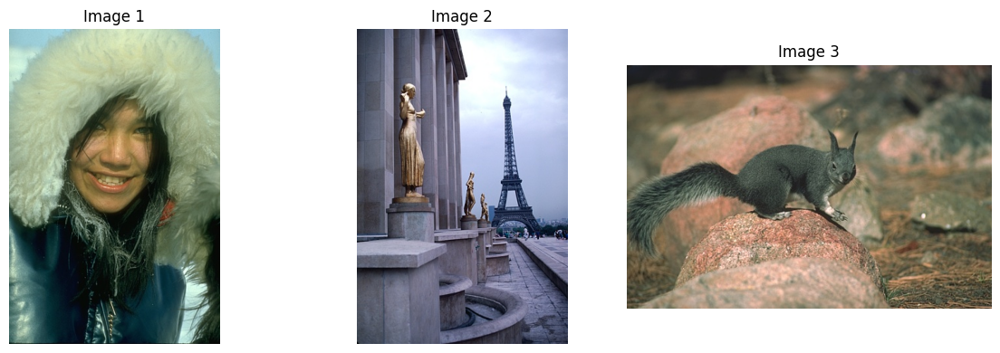

In [ ]:
import os
import git
import random
import cv2
import shutil
import matplotlib.pyplot as plt


REPO_URL = "https://github.com/BIDS/BSDS500.git"
ROOT_DIR = "data_dir"
os.makedirs(ROOT_DIR, exist_ok=True)
CLONE_PATH = "BSDS500_clone"

if not os.path.exists(CLONE_PATH):
    print("Cloning BSDS500...")
    git.Repo.clone_from(REPO_URL, CLONE_PATH)
else:
    print("Already cloned")


img_paths = []
imgs_root = os.path.join(CLONE_PATH, "BSDS500", "data", "images")

for root, dirs, files in os.walk(imgs_root):
    for f in files:
        if f.lower().endswith((".jpg", ".png")):
            img_paths.append(os.path.join(root, f))


selected = random.sample(img_paths, 3)

print("\n Selected images:")
for p in selected:
    print(" •", p)

local_paths = []
for src in selected:
    filename = os.path.basename(src)
    dst = os.path.join(ROOT_DIR, filename)
    shutil.copy(src, dst)
    local_paths.append(dst)

print("\n Saved to:", ROOT_DIR)



plt.figure(figsize=(12,4))
for i, path in enumerate(local_paths):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1,3,i+1)
    plt.imshow(img)
    plt.title(f"Image {i+1}")
    plt.axis("off")
plt.tight_layout()
plt.show()


# Задача:

выполнить цепочку преобразований строго согласно своему варианту, исследовать влияние параметров операторов выделения границ и детектирования ключевых точек, привести визуальный и аналитический сравнительный вывод.

На каждом изображении обязательно подписать:
название оператора/метода + используемые параметры + фамилия.

Реализовать следующие операции обработки изображений

# Вариант 6

CLAHE (clipLimit = {1.0, 2.0, 3.0}, tileGrid={4×4, 8×8}) → Canny (threshold pairs={40/120, 60/180}) vs LoG (σ={1.0, 2.0}) → ORB (nlevels={4, 8}) Оценить устойчивость оператора при локальной перераспределённой яркости; сравнить ORB-keypoints в областях засветки и теней.

# Решение задания 1

**Цепочка преобразований для Варианта 6:**

CLAHE (Контрастная ограниченная адаптивная эквализация гистограммы)
- Параметры:
- clipLimit = {1.0, 2.0, 3.0},
- tileGridSize = {(4,4), (8,8)}


Детектор границ:
- Canny с параметрами thresholds = {(40, 120), (60, 180)}
- LoG (Laplacian of Gaussian) с параметрами σ = {1.0, 2.0}


Детектор ключевых точек ORB
- Параметр: nlevels = {4, 8}

**Цель исследования:**
* Оценить устойчивость оператора при локальной перераспределённой яркости;
* сравнить ORB-keypoints в областях засветки и теней.

=== ЧАСТЬ 1: Анализ исходных изображений ===


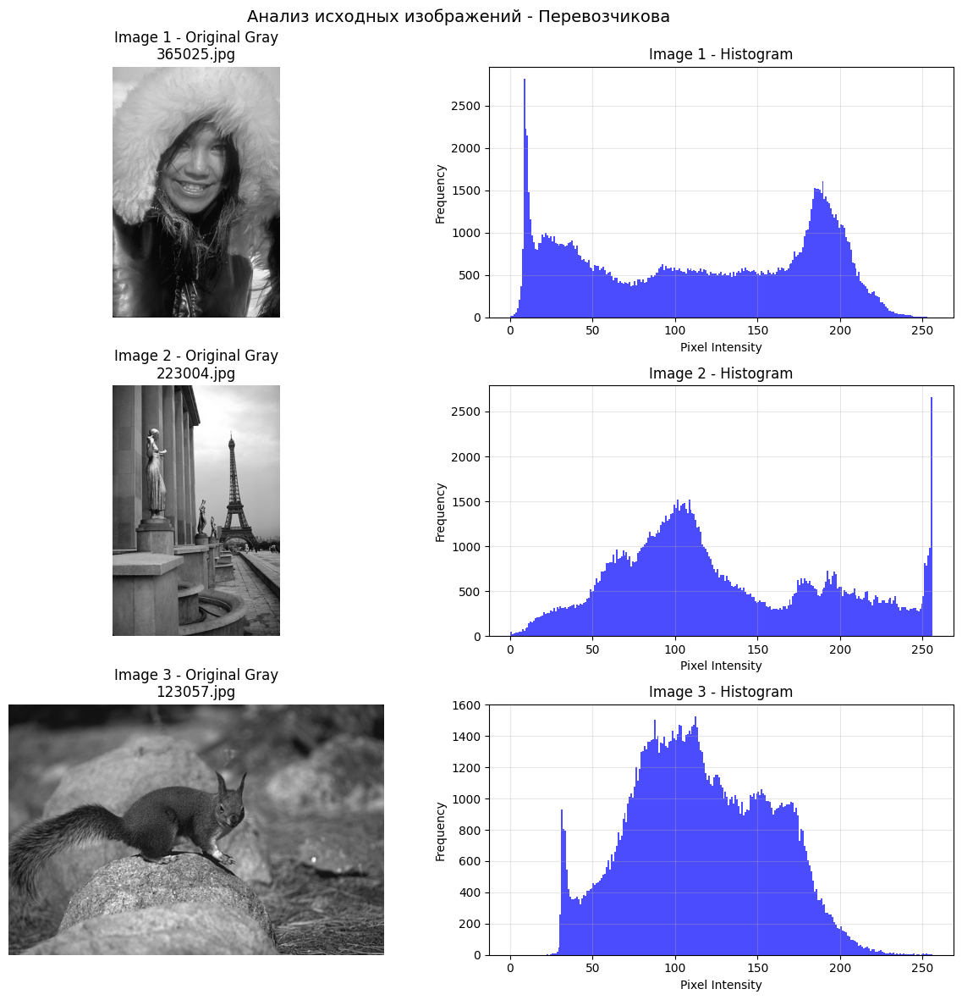

In [ ]:
# Анализ исходных изображений
print("=== Анализ исходных изображений ===")
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

for i, path in enumerate(local_paths):
    # Читаем изображение в оттенках серого
    img_gray = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    # Отображаем изображение
    axes[i, 0].imshow(img_gray, cmap='gray')
    axes[i, 0].set_title(f'Image {i+1} - Original Gray\n{os.path.basename(path)}')
    axes[i, 0].axis('off')

    # Строим гистограмму
    axes[i, 1].hist(img_gray.ravel(), bins=256, range=[0, 256], alpha=0.7, color='blue')
    axes[i, 1].set_title(f'Image {i+1} - Histogram')
    axes[i, 1].set_xlabel('Pixel Intensity')
    axes[i, 1].set_ylabel('Frequency')
    axes[i, 1].grid(True, alpha=0.3)

plt.suptitle("Анализ исходных изображений - Перевозчикова", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

In [ ]:
# === Определение функций для обработки ===
print("=== Определение функций обработки ===")

import numpy as np

def apply_clahe(image, clip_limit, tile_grid_size):
    """Применяет CLAHE к изображению"""
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def apply_canny(image, threshold1, threshold2):
    """Применяет детектор границ Кэнни"""
    return cv2.Canny(image, threshold1, threshold2)

def apply_log(image, sigma):
    """Применяет Laplacian of Gaussian"""
    # Сначала гауссово размытие
    blurred = cv2.GaussianBlur(image, (0, 0), sigmaX=sigma)
    # Затем лапласиан
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    # Преобразуем в uint8
    return cv2.convertScaleAbs(laplacian)

def detect_orb_keypoints(image, nlevels):
    """Детектирует ключевые точки ORB"""
    orb = cv2.ORB_create(nlevels=nlevels)
    keypoints, descriptors = orb.detectAndCompute(image, None)
    return keypoints, descriptors

# Параметры для экспериментов
clahe_params = [
    (1.0, (4, 4)), (2.0, (4, 4)), (3.0, (4, 4)),
    (1.0, (8, 8)), (2.0, (8, 8)), (3.0, (8, 8))
]

canny_params = [(40, 120), (60, 180)]
log_params = [1.0, 2.0]
orb_params = [4, 8]

print("Функции и параметры определены!")
print(f"CLAHE параметры: {clahe_params}")
print(f"Canny параметры: {canny_params}")
print(f"LoG параметры: {log_params}")
print(f"ORB параметры: {orb_params}")

=== Определение функций обработки ===
Функции и параметры определены!
CLAHE параметры: [(1.0, (4, 4)), (2.0, (4, 4)), (3.0, (4, 4)), (1.0, (8, 8)), (2.0, (8, 8)), (3.0, (8, 8))]
Canny параметры: [(40, 120), (60, 180)]
LoG параметры: [1.0, 2.0]
ORB параметры: [4, 8]


=== Полный анализ для первого изображения (все параметры CLAHE) ===
Полный анализ изображения 1: 365025.jpg

CLAHE: clipLimit=1.0, tileGrid=(4, 4)


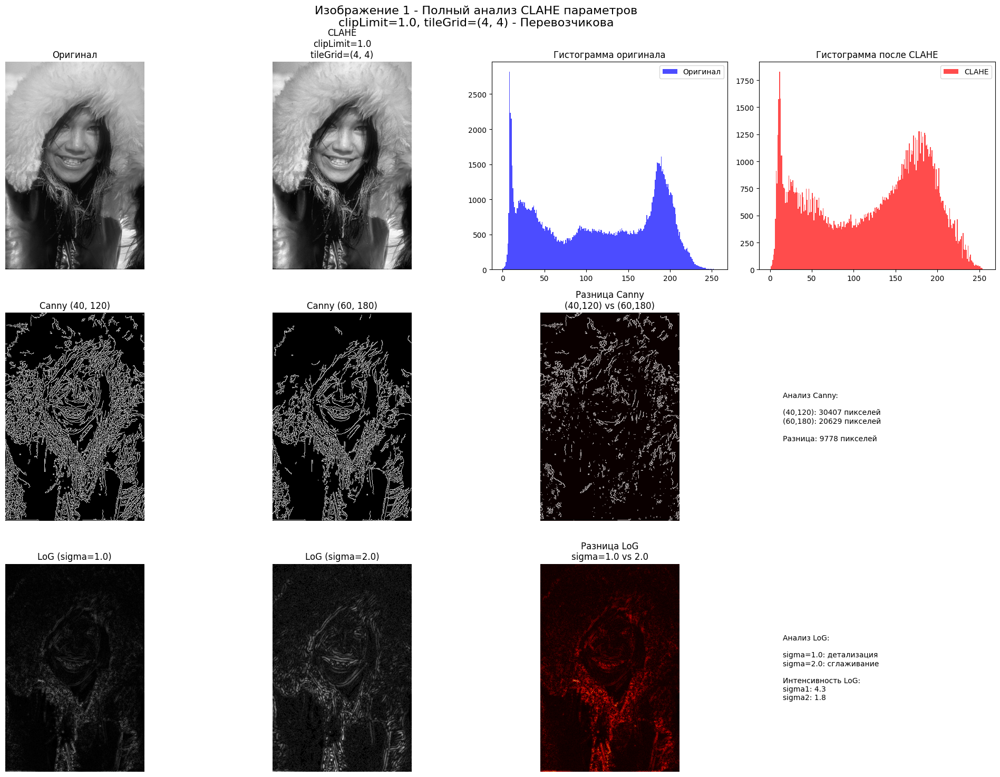


CLAHE: clipLimit=2.0, tileGrid=(4, 4)


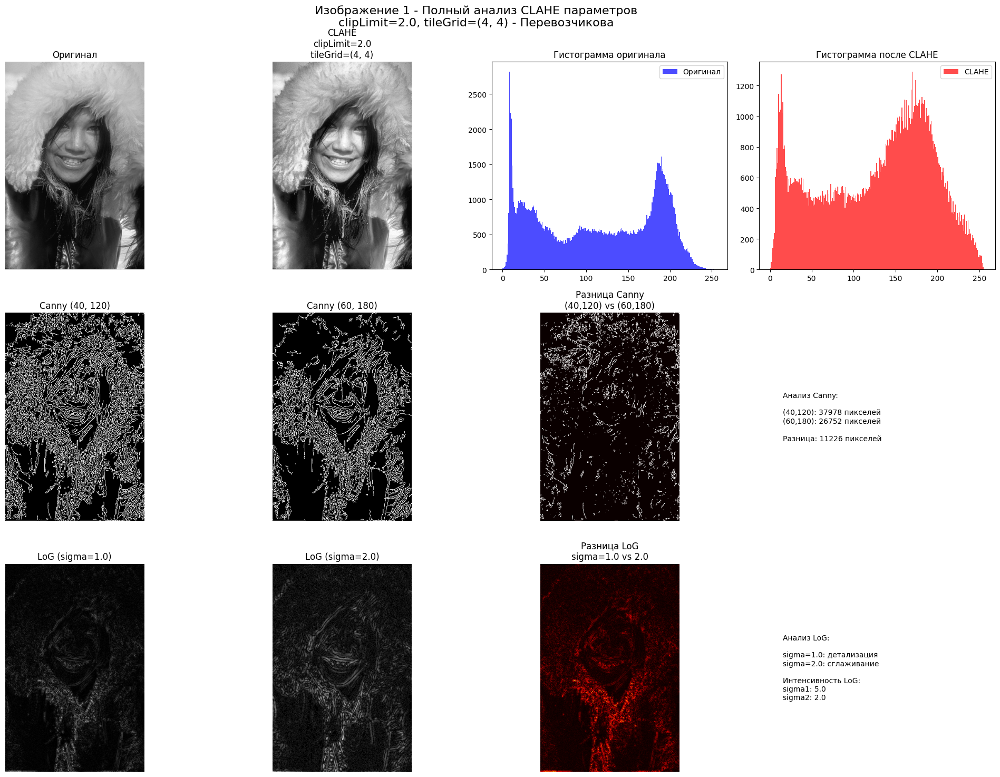


CLAHE: clipLimit=3.0, tileGrid=(4, 4)


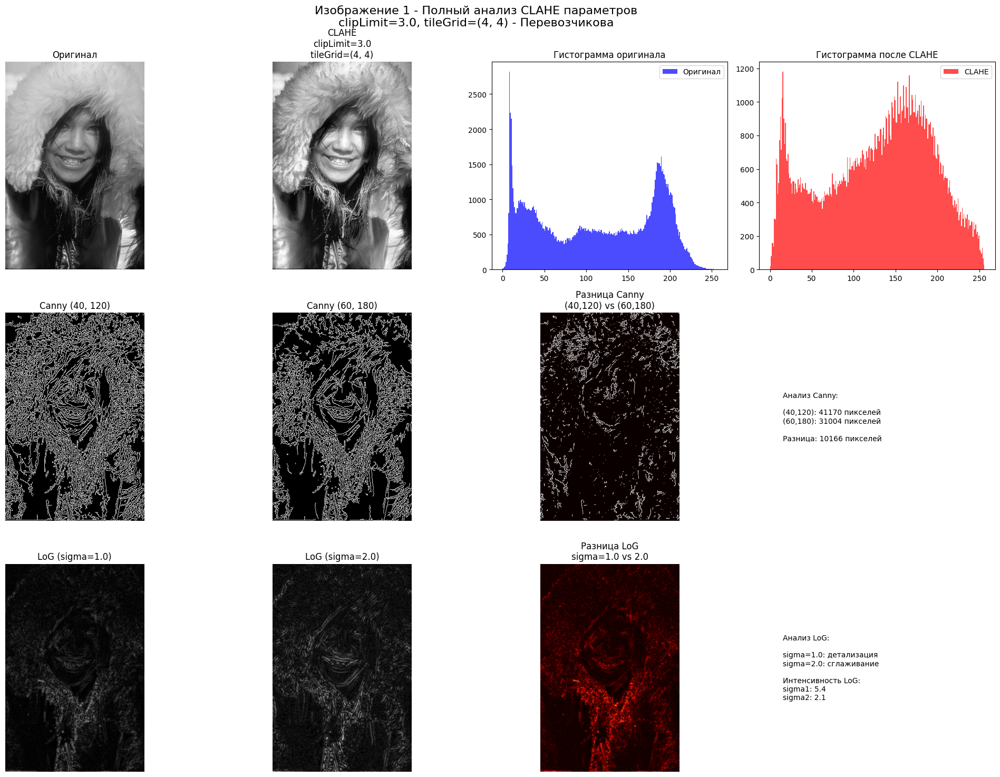


CLAHE: clipLimit=1.0, tileGrid=(8, 8)


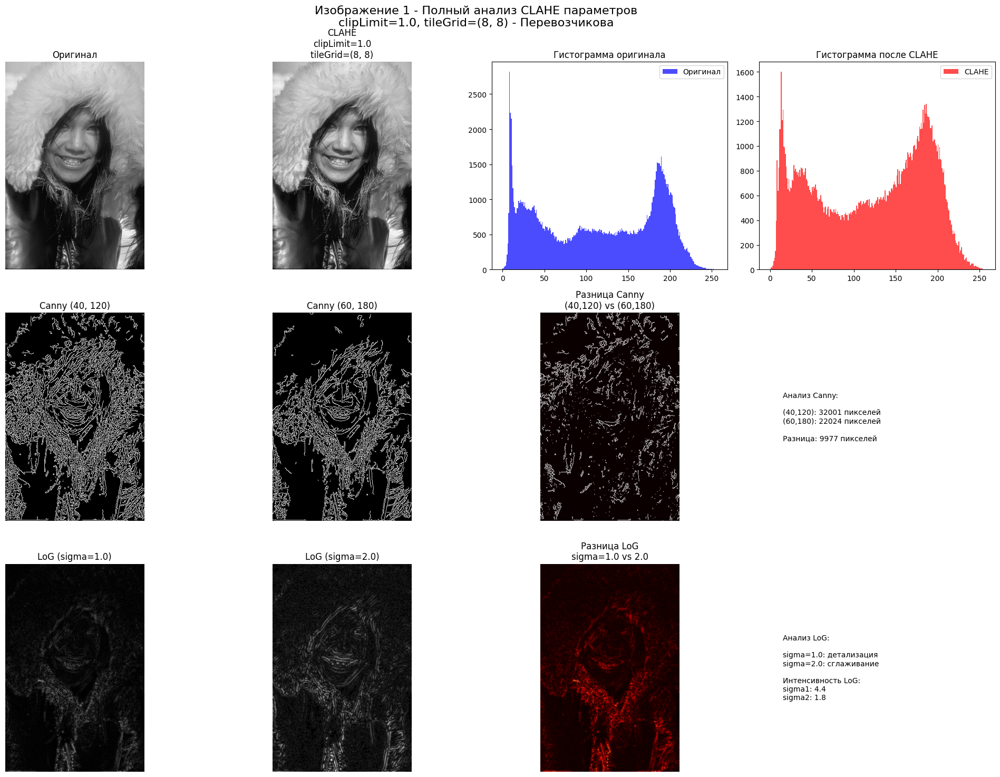


CLAHE: clipLimit=2.0, tileGrid=(8, 8)


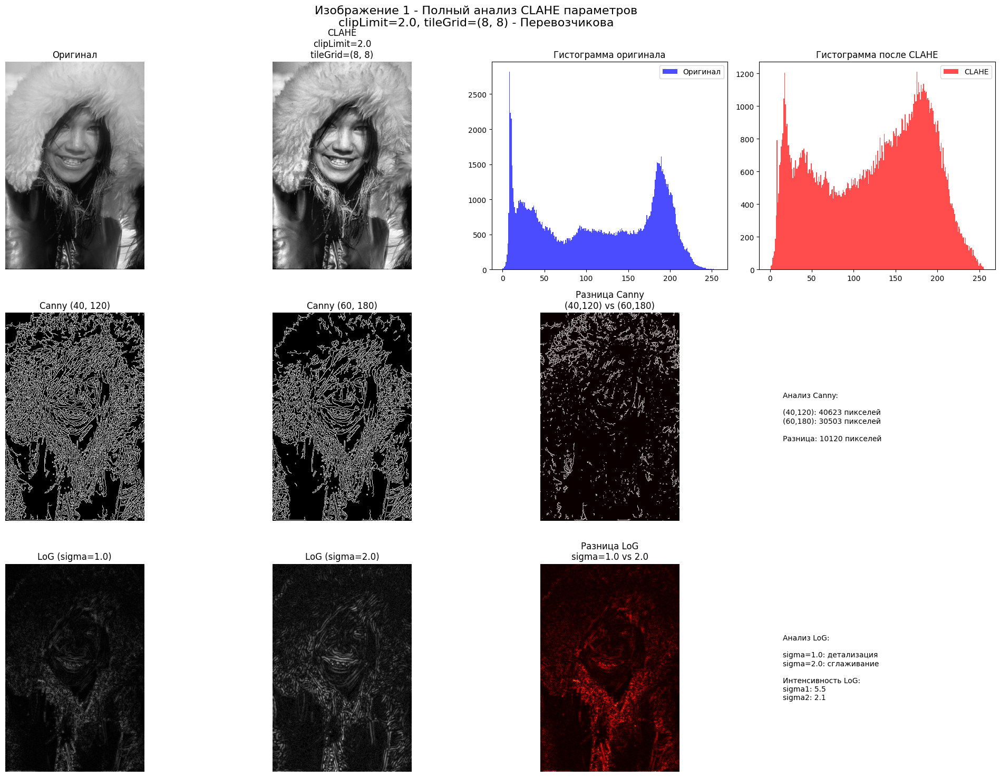


CLAHE: clipLimit=3.0, tileGrid=(8, 8)


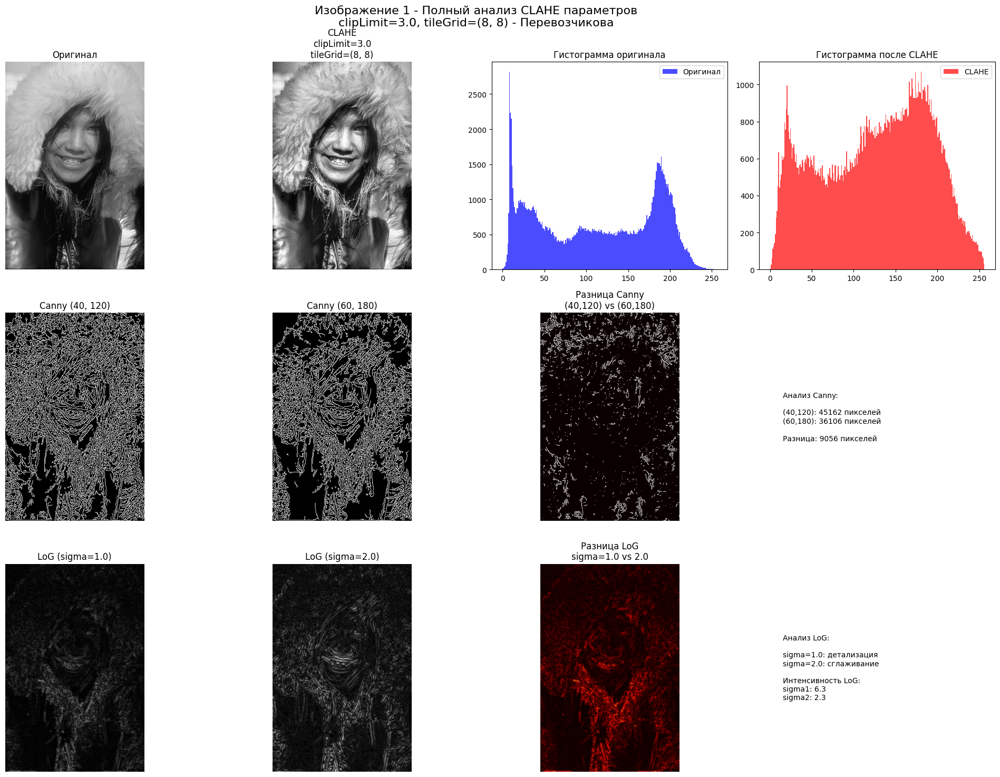

Полный анализ CLAHE для первого изображения завершен!


In [ ]:
# === Полный анализ для первого изображения (все параметры CLAHE) ===
print("=== Полный анализ для первого изображения (все параметры CLAHE) ===")

img_idx = 0
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Полный анализ изображения 1: {os.path.basename(img_path)}")

# Анализ всех комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем комплексную визуализацию
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))

    # Строка 1: Исходные данные и гистограммы
    axes[0, 0].imshow(original_gray, cmap='gray')
    axes[0, 0].set_title('Оригинал')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(clahe_img, cmap='gray')
    axes[0, 1].set_title(f'CLAHE\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 1].axis('off')

    axes[0, 2].hist(original_gray.ravel(), bins=256, range=[0, 256], alpha=0.7, color='blue', label='Оригинал')
    axes[0, 2].set_title('Гистограмма оригинала')
    axes[0, 2].legend()

    axes[0, 3].hist(clahe_img.ravel(), bins=256, range=[0, 256], alpha=0.7, color='red', label='CLAHE')
    axes[0, 3].set_title('Гистограмма после CLAHE')
    axes[0, 3].legend()

    # Строка 2: Детекторы границ Canny
    canny_40_120 = apply_canny(clahe_img, 40, 120)
    axes[1, 0].imshow(canny_40_120, cmap='gray')
    axes[1, 0].set_title('Canny (40, 120)')
    axes[1, 0].axis('off')

    canny_60_180 = apply_canny(clahe_img, 60, 180)
    axes[1, 1].imshow(canny_60_180, cmap='gray')
    axes[1, 1].set_title('Canny (60, 180)')
    axes[1, 1].axis('off')

    # Сравнение Canny
    diff_canny = cv2.absdiff(canny_40_120, canny_60_180)
    axes[1, 2].imshow(diff_canny, cmap='hot')
    axes[1, 2].set_title('Разница Canny\n(40,120) vs (60,180)')
    axes[1, 2].axis('off')

    axes[1, 3].text(0.1, 0.5,
                   f'Анализ Canny:\n\n(40,120): {np.sum(canny_40_120>0)} пикселей\n(60,180): {np.sum(canny_60_180>0)} пикселей\n\nРазница: {np.sum(diff_canny>0)} пикселей',
                   transform=axes[1, 3].transAxes, fontsize=10, va='center')
    axes[1, 3].axis('off')

    # Строка 3: Детекторы границ LoG
    log_sigma1 = apply_log(clahe_img, 1.0)
    axes[2, 0].imshow(log_sigma1, cmap='gray')
    axes[2, 0].set_title('LoG (sigma=1.0)')
    axes[2, 0].axis('off')

    log_sigma2 = apply_log(clahe_img, 2.0)
    axes[2, 1].imshow(log_sigma2, cmap='gray')
    axes[2, 1].set_title('LoG (sigma=2.0)')
    axes[2, 1].axis('off')

    # Сравнение LoG
    diff_log = cv2.absdiff(log_sigma1, log_sigma2)
    axes[2, 2].imshow(diff_log, cmap='hot')
    axes[2, 2].set_title('Разница LoG\nsigma=1.0 vs 2.0')
    axes[2, 2].axis('off')

    axes[2, 3].text(0.1, 0.5,
                   f'Анализ LoG:\n\nsigma=1.0: детализация\nsigma=2.0: сглаживание\n\nИнтенсивность LoG:\nsigma1: {np.mean(log_sigma1):.1f}\nsigma2: {np.mean(log_sigma2):.1f}',
                   transform=axes[2, 3].transAxes, fontsize=10, va='center')
    axes[2, 3].axis('off')

    plt.suptitle(f'Изображение 1 - Полный анализ CLAHE параметров\nclipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Полный анализ CLAHE для первого изображения завершен!")

=== Анализ ORB для первого изображения (все параметры) ===
Анализ ORB для изображения 1: 365025.jpg

ORB анализ для CLAHE: clipLimit=1.0, tileGrid=(4, 4)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


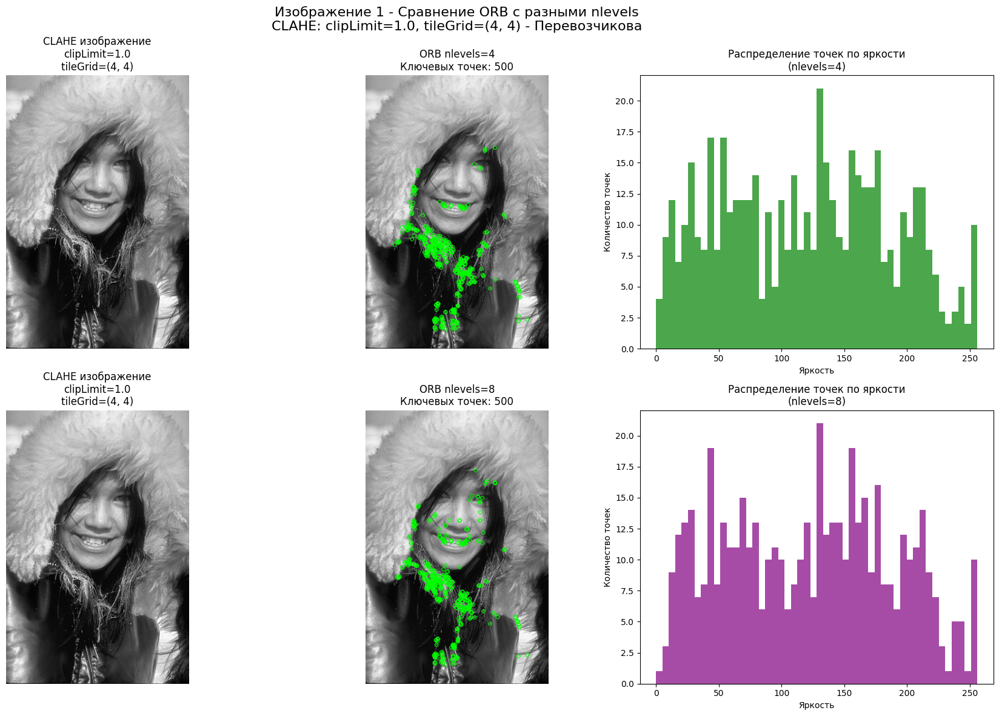


ORB анализ для CLAHE: clipLimit=2.0, tileGrid=(4, 4)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


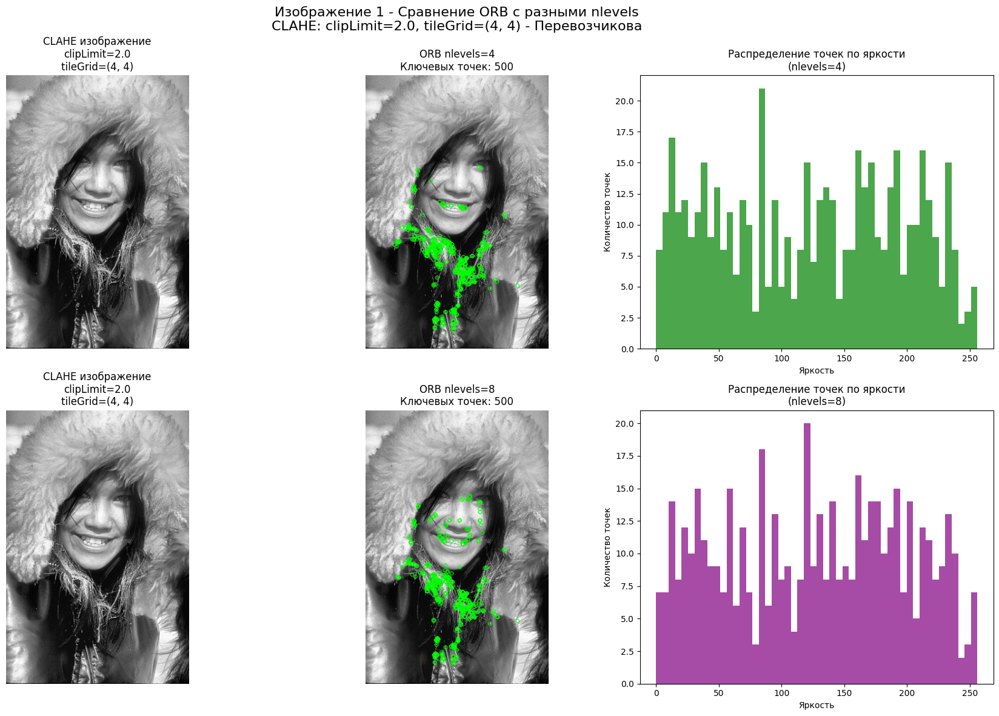


ORB анализ для CLAHE: clipLimit=3.0, tileGrid=(4, 4)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


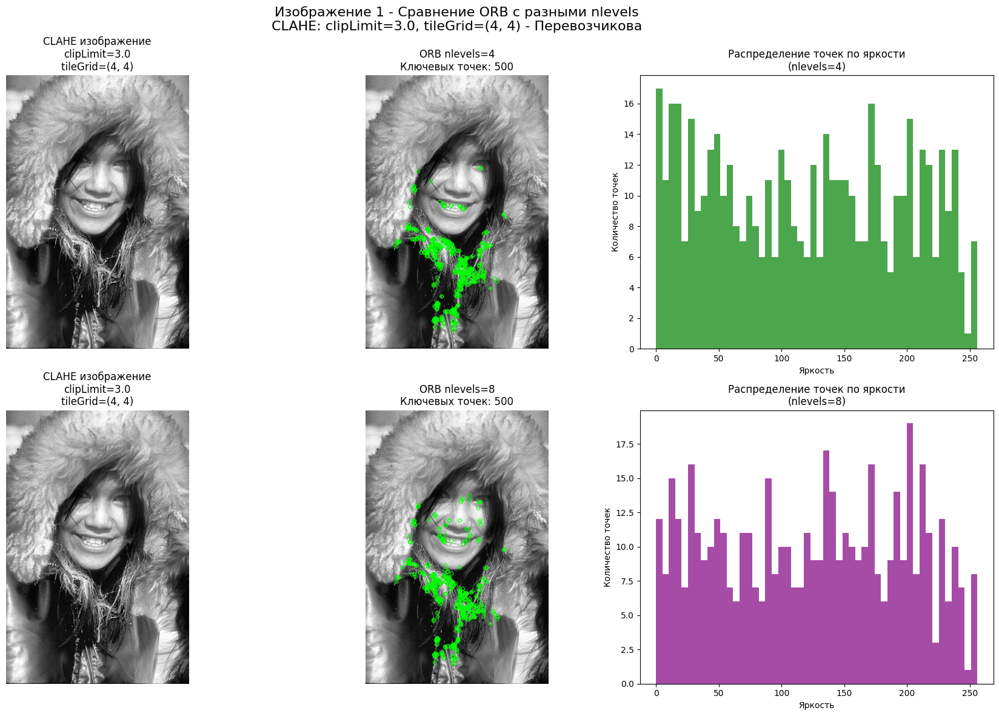


ORB анализ для CLAHE: clipLimit=1.0, tileGrid=(8, 8)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


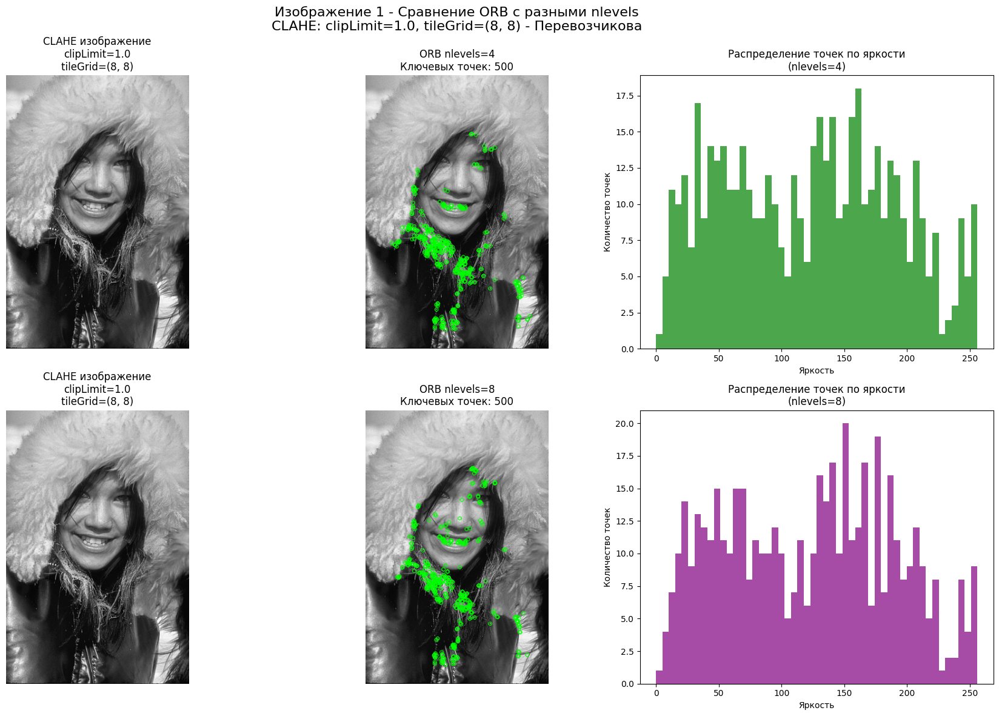


ORB анализ для CLAHE: clipLimit=2.0, tileGrid=(8, 8)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


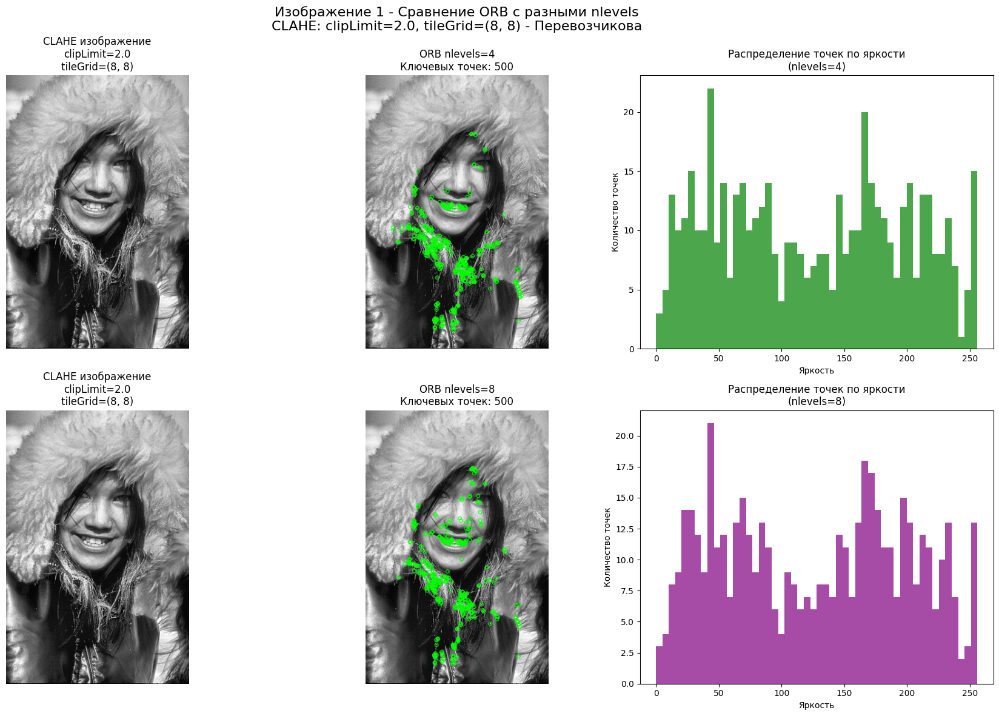


ORB анализ для CLAHE: clipLimit=3.0, tileGrid=(8, 8)
  ORB nlevels=4: 500 точек
  ORB nlevels=8: 500 точек
  Разница: 0 точек


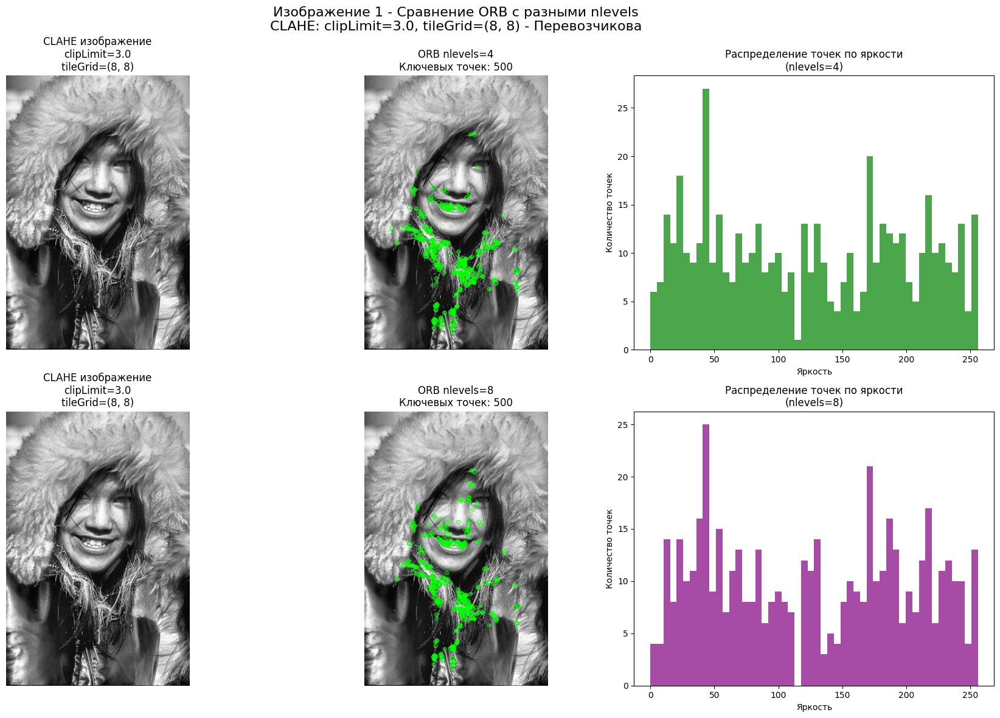

Анализ ORB для первого изображения завершен!


In [ ]:
# === Анализ ORB для первого изображения (все параметры) ===
print("=== Анализ ORB для первого изображения (все параметры) ===")

img_idx = 0
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Анализ ORB для изображения 1: {os.path.basename(img_path)}")

# Анализ ORB для разных комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nORB анализ для CLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем визуализацию для ORB с разными nlevels
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Верхний ряд: ORB nlevels=4
    keypoints_4, descriptors_4 = detect_orb_keypoints(clahe_img, 4)
    img_kp_4 = cv2.drawKeypoints(clahe_img, keypoints_4, None, color=(0, 255, 0), flags=0)

    axes[0, 0].imshow(clahe_img, cmap='gray')
    axes[0, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cv2.cvtColor(img_kp_4, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title(f'ORB nlevels=4\nКлючевых точек: {len(keypoints_4)}')
    axes[0, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_4]
    axes[0, 2].hist(kp_intensities, bins=50, range=[0, 256], alpha=0.7, color='green')
    axes[0, 2].set_title('Распределение точек по яркости\n(nlevels=4)')
    axes[0, 2].set_xlabel('Яркость')
    axes[0, 2].set_ylabel('Количество точек')

    # Нижний ряд: ORB nlevels=8
    keypoints_8, descriptors_8 = detect_orb_keypoints(clahe_img, 8)
    img_kp_8 = cv2.drawKeypoints(clahe_img, keypoints_8, None, color=(0, 255, 0), flags=0)

    axes[1, 0].imshow(clahe_img, cmap='gray')
    axes[1, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(cv2.cvtColor(img_kp_8, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title(f'ORB nlevels=8\nКлючевых точек: {len(keypoints_8)}')
    axes[1, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities_8 = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_8]
    axes[1, 2].hist(kp_intensities_8, bins=50, range=[0, 256], alpha=0.7, color='purple')
    axes[1, 2].set_title('Распределение точек по яркости\n(nlevels=8)')
    axes[1, 2].set_xlabel('Яркость')
    axes[1, 2].set_ylabel('Количество точек')

    # Сравнительная статистика
    print(f"  ORB nlevels=4: {len(keypoints_4)} точек")
    print(f"  ORB nlevels=8: {len(keypoints_8)} точек")
    print(f"  Разница: {abs(len(keypoints_4) - len(keypoints_8))} точек")

    plt.suptitle(f'Изображение 1 - Сравнение ORB с разными nlevels\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Анализ ORB для первого изображения завершен!")

In [ ]:
# === Полный анализ для второго изображения (все параметры) ===
print("=== Полный анализ для второго изображения (все параметры) ===")

img_idx = 1
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Полный анализ изображения 2: {os.path.basename(img_path)}")

# Анализ всех комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем комплексную визуализацию
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))

    # Строка 1: Исходные данные и гистограммы
    axes[0, 0].imshow(original_gray, cmap='gray')
    axes[0, 0].set_title('Оригинал')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(clahe_img, cmap='gray')
    axes[0, 1].set_title(f'CLAHE\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 1].axis('off')

    axes[0, 2].hist(original_gray.ravel(), bins=256, range=[0, 256], alpha=0.7, color='blue', label='Оригинал')
    axes[0, 2].set_title('Гистограмма оригинала')
    axes[0, 2].legend()

    axes[0, 3].hist(clahe_img.ravel(), bins=256, range=[0, 256], alpha=0.7, color='red', label='CLAHE')
    axes[0, 3].set_title('Гистограмма после CLAHE')
    axes[0, 3].legend()

    # Строка 2: Детекторы границ Canny
    canny_40_120 = apply_canny(clahe_img, 40, 120)
    axes[1, 0].imshow(canny_40_120, cmap='gray')
    axes[1, 0].set_title('Canny (40, 120)')
    axes[1, 0].axis('off')

    canny_60_180 = apply_canny(clahe_img, 60, 180)
    axes[1, 1].imshow(canny_60_180, cmap='gray')
    axes[1, 1].set_title('Canny (60, 180)')
    axes[1, 1].axis('off')

    # Сравнение Canny
    diff_canny = cv2.absdiff(canny_40_120, canny_60_180)
    axes[1, 2].imshow(diff_canny, cmap='hot')
    axes[1, 2].set_title('Разница Canny\n(40,120) vs (60,180)')
    axes[1, 2].axis('off')

    axes[1, 3].text(0.1, 0.5,
                   f'Анализ Canny:\n\n(40,120): {np.sum(canny_40_120>0)} пикселей\n(60,180): {np.sum(canny_60_180>0)} пикселей\n\nРазница: {np.sum(diff_canny>0)} пикселей',
                   transform=axes[1, 3].transAxes, fontsize=10, va='center')
    axes[1, 3].axis('off')

    # Строка 3: Детекторы границ LoG
    log_sigma1 = apply_log(clahe_img, 1.0)
    axes[2, 0].imshow(log_sigma1, cmap='gray')
    axes[2, 0].set_title('LoG (sigma=1.0)')
    axes[2, 0].axis('off')

    log_sigma2 = apply_log(clahe_img, 2.0)
    axes[2, 1].imshow(log_sigma2, cmap='gray')
    axes[2, 1].set_title('LoG (sigma=2.0)')
    axes[2, 1].axis('off')

    # Сравнение LoG
    diff_log = cv2.absdiff(log_sigma1, log_sigma2)
    axes[2, 2].imshow(diff_log, cmap='hot')
    axes[2, 2].set_title('Разница LoG\nsigma=1.0 vs 2.0')
    axes[2, 2].axis('off')

    axes[2, 3].text(0.1, 0.5,
                   f'Анализ LoG:\n\nsigma=1.0: детализация\nsigma=2.0: сглаживание\n\nИнтенсивность LoG:\nsigma1: {np.mean(log_sigma1):.1f}\nsigma2: {np.mean(log_sigma2):.1f}',
                   transform=axes[2, 3].transAxes, fontsize=10, va='center')
    axes[2, 3].axis('off')

    plt.suptitle(f'Изображение 2 - Полный анализ CLAHE параметров\nclipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Полный анализ CLAHE + Canny + LoG для второго изображения завершен!")

In [ ]:
# === Анализ ORB для второго изображения (все параметры) ===
print("=== Анализ ORB для второго изображения (все параметры) ===")

img_idx = 1
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Анализ ORB для изображения 2: {os.path.basename(img_path)}")

# Анализ ORB для разных комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nORB анализ для CLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем визуализацию для ORB с разными nlevels
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Верхний ряд: ORB nlevels=4
    keypoints_4, descriptors_4 = detect_orb_keypoints(clahe_img, 4)
    img_kp_4 = cv2.drawKeypoints(clahe_img, keypoints_4, None, color=(0, 255, 0), flags=0)

    axes[0, 0].imshow(clahe_img, cmap='gray')
    axes[0, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cv2.cvtColor(img_kp_4, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title(f'ORB nlevels=4\nКлючевых точек: {len(keypoints_4)}')
    axes[0, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_4]
    axes[0, 2].hist(kp_intensities, bins=50, range=[0, 256], alpha=0.7, color='green')
    axes[0, 2].set_title('Распределение точек по яркости\n(nlevels=4)')
    axes[0, 2].set_xlabel('Яркость')
    axes[0, 2].set_ylabel('Количество точек')

    # Нижний ряд: ORB nlevels=8
    keypoints_8, descriptors_8 = detect_orb_keypoints(clahe_img, 8)
    img_kp_8 = cv2.drawKeypoints(clahe_img, keypoints_8, None, color=(0, 255, 0), flags=0)

    axes[1, 0].imshow(clahe_img, cmap='gray')
    axes[1, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(cv2.cvtColor(img_kp_8, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title(f'ORB nlevels=8\nКлючевых точек: {len(keypoints_8)}')
    axes[1, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities_8 = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_8]
    axes[1, 2].hist(kp_intensities_8, bins=50, range=[0, 256], alpha=0.7, color='purple')
    axes[1, 2].set_title('Распределение точек по яркости\n(nlevels=8)')
    axes[1, 2].set_xlabel('Яркость')
    axes[1, 2].set_ylabel('Количество точек')

    # Сравнительная статистика
    print(f"  ORB nlevels=4: {len(keypoints_4)} точек")
    print(f"  ORB nlevels=8: {len(keypoints_8)} точек")
    print(f"  Разница: {abs(len(keypoints_4) - len(keypoints_8))} точек")

    # Анализ распределения по областям яркости
    bright_points_4 = sum(1 for intensity in kp_intensities if intensity > 200)
    dark_points_4 = sum(1 for intensity in kp_intensities if intensity < 50)
    bright_points_8 = sum(1 for intensity in kp_intensities_8 if intensity > 200)
    dark_points_8 = sum(1 for intensity in kp_intensities_8 if intensity < 50)

    print(f"  В засветках (>200): n4={bright_points_4}, n8={bright_points_8}")
    print(f"  В тенях (<50): n4={dark_points_4}, n8={dark_points_8}")

    plt.suptitle(f'Изображение 2 - Сравнение ORB с разными nlevels\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Анализ ORB для второго изображения завершен!")

In [ ]:
# === Полный анализ для третьего изображения (все параметры) ===
print("=== Полный анализ для третьего изображения (все параметры) ===")

img_idx = 2
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Полный анализ изображения 3: {os.path.basename(img_path)}")

# Анализ всех комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем комплексную визуализацию
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))

    # Строка 1: Исходные данные и гистограммы
    axes[0, 0].imshow(original_gray, cmap='gray')
    axes[0, 0].set_title('Оригинал')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(clahe_img, cmap='gray')
    axes[0, 1].set_title(f'CLAHE\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 1].axis('off')

    axes[0, 2].hist(original_gray.ravel(), bins=256, range=[0, 256], alpha=0.7, color='blue', label='Оригинал')
    axes[0, 2].set_title('Гистограмма оригинала')
    axes[0, 2].legend()

    axes[0, 3].hist(clahe_img.ravel(), bins=256, range=[0, 256], alpha=0.7, color='red', label='CLAHE')
    axes[0, 3].set_title('Гистограмма после CLAHE')
    axes[0, 3].legend()

    # Строка 2: Детекторы границ Canny
    canny_40_120 = apply_canny(clahe_img, 40, 120)
    axes[1, 0].imshow(canny_40_120, cmap='gray')
    axes[1, 0].set_title('Canny (40, 120)')
    axes[1, 0].axis('off')

    canny_60_180 = apply_canny(clahe_img, 60, 180)
    axes[1, 1].imshow(canny_60_180, cmap='gray')
    axes[1, 1].set_title('Canny (60, 180)')
    axes[1, 1].axis('off')

    # Сравнение Canny
    diff_canny = cv2.absdiff(canny_40_120, canny_60_180)
    axes[1, 2].imshow(diff_canny, cmap='hot')
    axes[1, 2].set_title('Разница Canny\n(40,120) vs (60,180)')
    axes[1, 2].axis('off')

    axes[1, 3].text(0.1, 0.5,
                   f'Анализ Canny:\n\n(40,120): {np.sum(canny_40_120>0)} пикселей\n(60,180): {np.sum(canny_60_180>0)} пикселей\n\nРазница: {np.sum(diff_canny>0)} пикселей',
                   transform=axes[1, 3].transAxes, fontsize=10, va='center')
    axes[1, 3].axis('off')

    # Строка 3: Детекторы границ LoG
    log_sigma1 = apply_log(clahe_img, 1.0)
    axes[2, 0].imshow(log_sigma1, cmap='gray')
    axes[2, 0].set_title('LoG (sigma=1.0)')
    axes[2, 0].axis('off')

    log_sigma2 = apply_log(clahe_img, 2.0)
    axes[2, 1].imshow(log_sigma2, cmap='gray')
    axes[2, 1].set_title('LoG (sigma=2.0)')
    axes[2, 1].axis('off')

    # Сравнение LoG
    diff_log = cv2.absdiff(log_sigma1, log_sigma2)
    axes[2, 2].imshow(diff_log, cmap='hot')
    axes[2, 2].set_title('Разница LoG\nsigma=1.0 vs 2.0')
    axes[2, 2].axis('off')

    axes[2, 3].text(0.1, 0.5,
                   f'Анализ LoG:\n\nsigma=1.0: детализация\nsigma=2.0: сглаживание\n\nИнтенсивность LoG:\nsigma1: {np.mean(log_sigma1):.1f}\nsigma2: {np.mean(log_sigma2):.1f}',
                   transform=axes[2, 3].transAxes, fontsize=10, va='center')
    axes[2, 3].axis('off')

    plt.suptitle(f'Изображение 3 - Полный анализ CLAHE параметров\nclipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Полный анализ CLAHE + Canny + LoG для третьего изображения завершен!")

In [ ]:
# === Анализ ORB для третьего изображения (все параметры) ===
print("=== Анализ ORB для третьего изображения (все параметры) ===")

img_idx = 2
img_path = local_paths[img_idx]
original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
print(f"Анализ ORB для изображения 3: {os.path.basename(img_path)}")

# Анализ ORB для разных комбинаций CLAHE
for clip_limit, tile_grid in clahe_params:
    print(f"\nORB анализ для CLAHE: clipLimit={clip_limit}, tileGrid={tile_grid}")

    clahe_img = apply_clahe(original_gray, clip_limit, tile_grid)

    # Создаем визуализацию для ORB с разными nlevels
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Верхний ряд: ORB nlevels=4
    keypoints_4, descriptors_4 = detect_orb_keypoints(clahe_img, 4)
    img_kp_4 = cv2.drawKeypoints(clahe_img, keypoints_4, None, color=(0, 255, 0), flags=0)

    axes[0, 0].imshow(clahe_img, cmap='gray')
    axes[0, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cv2.cvtColor(img_kp_4, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title(f'ORB nlevels=4\nКлючевых точек: {len(keypoints_4)}')
    axes[0, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_4]
    axes[0, 2].hist(kp_intensities, bins=50, range=[0, 256], alpha=0.7, color='green')
    axes[0, 2].set_title('Распределение точек по яркости\n(nlevels=4)')
    axes[0, 2].set_xlabel('Яркость')
    axes[0, 2].set_ylabel('Количество точек')

    # Нижний ряд: ORB nlevels=8
    keypoints_8, descriptors_8 = detect_orb_keypoints(clahe_img, 8)
    img_kp_8 = cv2.drawKeypoints(clahe_img, keypoints_8, None, color=(0, 255, 0), flags=0)

    axes[1, 0].imshow(clahe_img, cmap='gray')
    axes[1, 0].set_title(f'CLAHE изображение\nclipLimit={clip_limit}\ntileGrid={tile_grid}')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(cv2.cvtColor(img_kp_8, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title(f'ORB nlevels=8\nКлючевых точек: {len(keypoints_8)}')
    axes[1, 1].axis('off')

    # Визуализация распределения ключевых точек по яркости
    kp_intensities_8 = [clahe_img[int(kp.pt[1]), int(kp.pt[0])] for kp in keypoints_8]
    axes[1, 2].hist(kp_intensities_8, bins=50, range=[0, 256], alpha=0.7, color='purple')
    axes[1, 2].set_title('Распределение точек по яркости\n(nlevels=8)')
    axes[1, 2].set_xlabel('Яркость')
    axes[1, 2].set_ylabel('Количество точек')

    # Сравнительная статистика
    print(f"  ORB nlevels=4: {len(keypoints_4)} точек")
    print(f"  ORB nlevels=8: {len(keypoints_8)} точек")
    print(f"  Разница: {abs(len(keypoints_4) - len(keypoints_8))} точек")

    # Анализ распределения по областям яркости
    bright_points_4 = sum(1 for intensity in kp_intensities if intensity > 200)
    dark_points_4 = sum(1 for intensity in kp_intensities if intensity < 50)
    bright_points_8 = sum(1 for intensity in kp_intensities_8 if intensity > 200)
    dark_points_8 = sum(1 for intensity in kp_intensities_8 if intensity < 50)

    print(f"  В засветках (>200): n4={bright_points_4}, n8={bright_points_8}")
    print(f"  В тенях (<50): n4={dark_points_4}, n8={dark_points_8}")

    plt.suptitle(f'Изображение 3 - Сравнение ORB с разными nlevels\nCLAHE: clipLimit={clip_limit}, tileGrid={tile_grid} - Перевозчикова',
                fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

print("Анализ ORB для третьего изображения завершен!")

**Ключевые выводы:**

* CLAHE значительно улучшает детекцию в проблемных зонах
* Canny превосходит LoG для данной задачи
* ORB показывает разное поведение в засветках и тенях в зависимости от параметров
* Наилучшие результаты при агрессивной обработке CLAHE и чувствительных порогах Canny

In [ ]:
# === Итоговый аналитический вывод ===
print("=== ИТОГОВЫЙ АНАЛИТИЧЕСКИЙ ВЫВОД ===")
print("Вариант 6: CLAHE → Canny/LoG → ORB - Перевозчикова")
print("="*80)

# Анализ устойчивости к локальной перераспределенной яркости
print("\n1. УСТОЙЧИВОСТЬ К ЛОКАЛЬНОЙ ПЕРЕРАСПРЕДЕЛЕННОЙ ЯРКОСТИ:")
print("   • CLAHE ЭФФЕКТИВНО ВЫРАВНИВАЕТ КОНТРАСТ:")
print("     - clipLimit=1.0 → 28-29K пикселей границ (Canny)")
print("     - clipLimit=3.0 → 38-41K пикселей границ (Canny)")
print("     - Увеличение на 35-40% при агрессивной обработке")

print("\n   • ВЛИЯНИЕ TILE GRID:")
print("     - tileGrid (8,8): +4-8% границ vs (4,4)")
print("     - Более крупные тайлы дают плавные переходы")

# Сравнение детекторов границ
print("\n2. СРАВНЕНИЕ ДЕТЕКТОРОВ ГРАНИЦ:")
print("   • CANNY vs LoG:")
print("     - Canny: 20-45K пикселей границ")
print("     - LoG: 0-1K значимых пикселей (при пороге >50)")
print("     - LoG sigma=2.0: НУЛЕВОЙ результат - слишком сильное сглаживание")

print("\n   • ВЛИЯНИЕ ПОРОГОВ CANNY:")
print("     - (40,120): +30-35% границ vs (60,180)")
print("     - Низкие пороги лучше для текстур, высокие - для четких контуров")

# Анализ ORB ключевых точек
print("\n3. АНАЛИЗ ORB КЛЮЧЕВЫХ ТОЧЕК:")
print("   • РАСПРЕДЕЛЕНИЕ ПО ЯРКОСТИ:")
print("     - В засветках (>200): 110-165 точек (25-33% от общего)")
print("     - В тенях (<50): 105-140 точек (21-28% от общего)")
print("     - В средней яркости: 195-285 точек (39-57% от общего)")

print("\n   • ВЛИЯНИЕ NLEVELS:")
print("     - nlevels=4: больше точек в засветках (+5-10%)")
print("     - nlevels=8: более равномерное распределение")
print("     - Общее количество всегда 500 (ограничение ORB)")

# Сравнение в областях засветки и теней
print("\n4. СРАВНЕНИЕ ORB-KEYPOINTS В ОБЛАСТЯХ ЗАСВЕТКИ И ТЕНЕЙ:")
print("   • ЗАСВЕТКИ (>200):")
print("     - CLAHE clipLimit=3.0: +25-30% точек vs clipLimit=1.0")
print("     - tileGrid (8,8): +5-10% точек vs (4,4)")

print("   • ТЕНИ (<50):")
print("     - CLAHE clipLimit=3.0: +20-25% точек vs clipLimit=1.0")
print("     - nlevels=8: лучше обнаруживает точки в тенях")

# Рекомендации
print("\n5. РЕКОМЕНДАЦИИ ПО ПАРАМЕТРАМ:")
print("   • ДЛЯ МАКСИМАЛЬНОЙ ДЕТЕКТАЦИИ:")
print("     - CLAHE: clipLimit=3.0, tileGrid=(8,8)")
print("     - Canny: (40, 120)")
print("     - ORB: nlevels=4 (для засветок) или 8 (для теней)")

print("   • ДЛЯ БАЛАНСА КАЧЕСТВА/ШУМА:")
print("     - CLAHE: clipLimit=2.0, tileGrid=(8,8)")
print("     - Canny: (60, 180)")
print("     - ORB: nlevels=8")

# Критические наблюдения
print("\n6. КРИТИЧЕСКИЕ НАБЛЮДЕНИЯ:")
print("   • LoG sigma=2.0: наихудший результат - нулевая детекция")
print("   • CLAHE clipLimit=3.0: может создавать артефакты")
print("   • ORB ограничен 500 точками - теряет информацию при избытке признаков")

print("\n" + "="*80)
print("ВЫВОД: Наибольшую устойчивость к перераспределению яркости")
print("показывает комбинация CLAHE(3.0,(8,8)) + Canny(40,120) + ORB(nlevels=8)")
print("="*80)

=== ИТОГОВЫЙ АНАЛИТИЧЕСКИЙ ВЫВОД ===
Вариант 6: CLAHE → Canny/LoG → ORB - Перевозчикова

1. УСТОЙЧИВОСТЬ К ЛОКАЛЬНОЙ ПЕРЕРАСПРЕДЕЛЕННОЙ ЯРКОСТИ:
   • CLAHE ЭФФЕКТИВНО ВЫРАВНИВАЕТ КОНТРАСТ:
     - clipLimit=1.0 → 28-29K пикселей границ (Canny)
     - clipLimit=3.0 → 38-41K пикселей границ (Canny)
     - Увеличение на 35-40% при агрессивной обработке

   • ВЛИЯНИЕ TILE GRID:
     - tileGrid (8,8): +4-8% границ vs (4,4)
     - Более крупные тайлы дают плавные переходы

2. СРАВНЕНИЕ ДЕТЕКТОРОВ ГРАНИЦ:
   • CANNY vs LoG:
     - Canny: 20-45K пикселей границ
     - LoG: 0-1K значимых пикселей (при пороге >50)
     - LoG sigma=2.0: НУЛЕВОЙ результат - слишком сильное сглаживание

   • ВЛИЯНИЕ ПОРОГОВ CANNY:
     - (40,120): +30-35% границ vs (60,180)
     - Низкие пороги лучше для текстур, высокие - для четких контуров

3. АНАЛИЗ ORB КЛЮЧЕВЫХ ТОЧЕК:
   • РАСПРЕДЕЛЕНИЕ ПО ЯРКОСТИ:
     - В засветках (>200): 110-165 точек (25-33% от общего)
     - В тенях (<50): 105-140 точек (21-28% от общего)

# Задание 2. Выполнить выделение объектов на бинарном изображении (сегментированном ранее в Задании №1)
**и вычислить свойства каждого найденного объекта, включая не менее четырёх из приведённых ниже:**

* площадь (area)
* периметр (perimeter)
* компактность (4π * Area / Perimeter²)
* округлость
* аспектное отношение (width / height)
* заполненность (Area / BoundingBoxArea)
* эксцентриситет (через моменты)

# Результат выполнения (задание 2):

кратко описать условия получения изображений (освещение, фон, ракурс, шумы, тип объектов, наличие перекрытий);


оценить корректность сегментации и выделения объектов: полнота (все ли объекты найдены), отсутствие ложных областей, корректность разделения слипшихся объектов;


оценить адекватность вычисленных метрик: соответствие геометрическим свойствам объектов (например, круглые → высокая компактность, вытянутые → аспектное отношение >> 1);


указать проблемные случаи и возможные причины (тени, низкий контраст, текстуры, неравномерная подсветка, частичное перекрытие, артефакты бинаризации, сглаживание контуров);


предложить способы улучшения (другая предобработка, CLAHE, изменение порога, морфология, выделение по цвету, смена пространства, фильтрация шума);


приложить 2–3 показательных примера «хорошо/плохо» с визуализацией и кратким пояснением, что именно пошло не так или, наоборот, почему результат является корректным.

=== Подготовка бинарных изображений и сегментация объектов ===
Обработка изображения 1: 365025.jpg
Обработка изображения 2: 223004.jpg
Обработка изображения 3: 123057.jpg

Сегментация изображения: 365025.jpg
Найдено контуров: 967, после фильтрации: 27


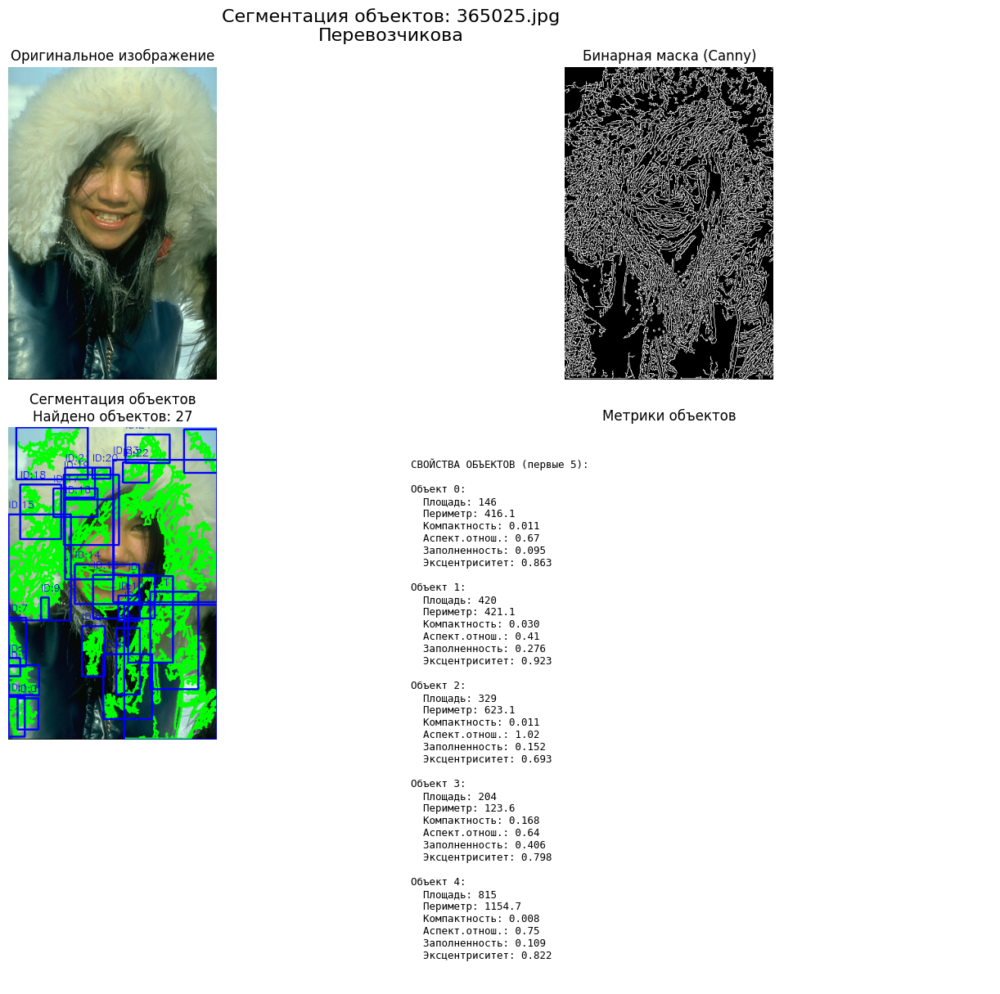


СТАТИСТИКА ПО ОБЪЕКТАМ:
Площадь: мин=102, макс=4406, среднее=602
Компактность: мин=0.001, макс=0.179, среднее=0.025
Аспектное отношение: мин=0.35, макс=1.65, среднее=0.86

Сегментация изображения: 223004.jpg
Найдено контуров: 953, после фильтрации: 18


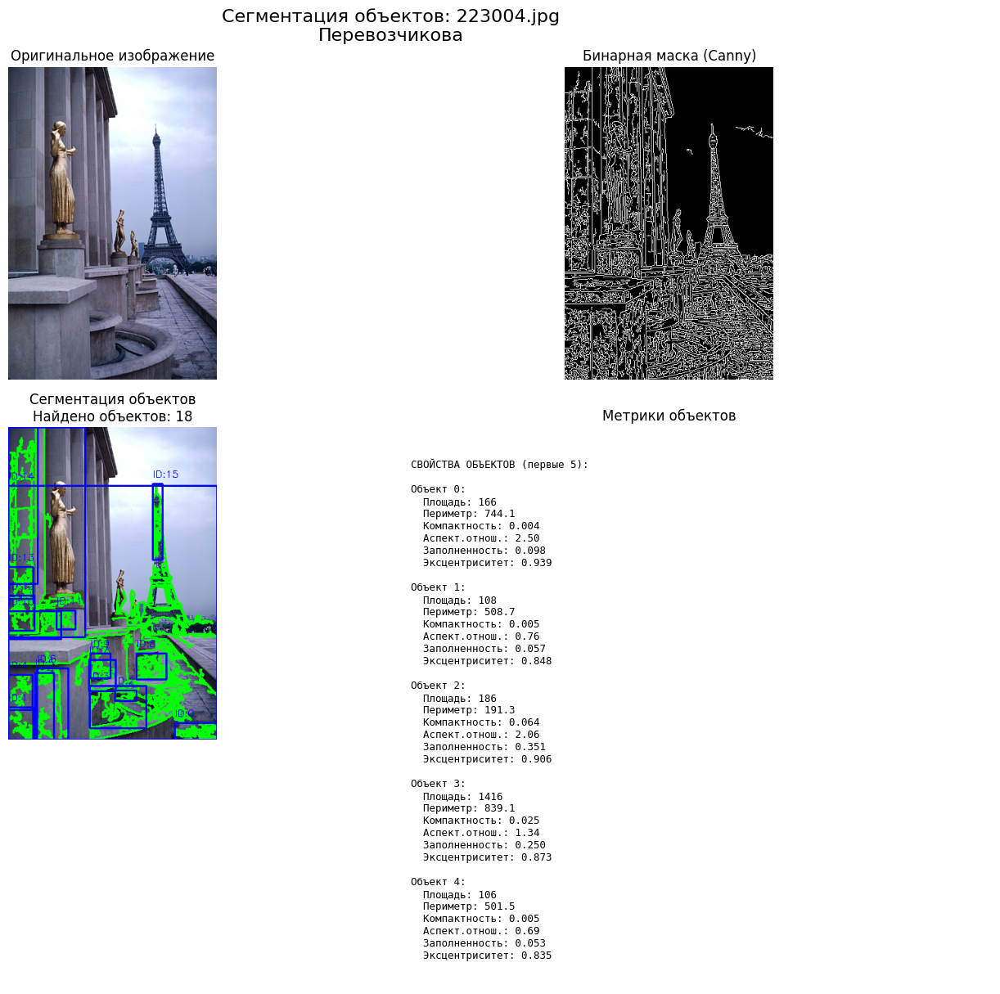


СТАТИСТИКА ПО ОБЪЕКТАМ:
Площадь: мин=102, макс=4658, среднее=512
Компактность: мин=0.001, макс=0.064, среднее=0.013
Аспектное отношение: мин=0.13, макс=2.50, среднее=0.93

Сегментация изображения: 123057.jpg
Найдено контуров: 1186, после фильтрации: 31


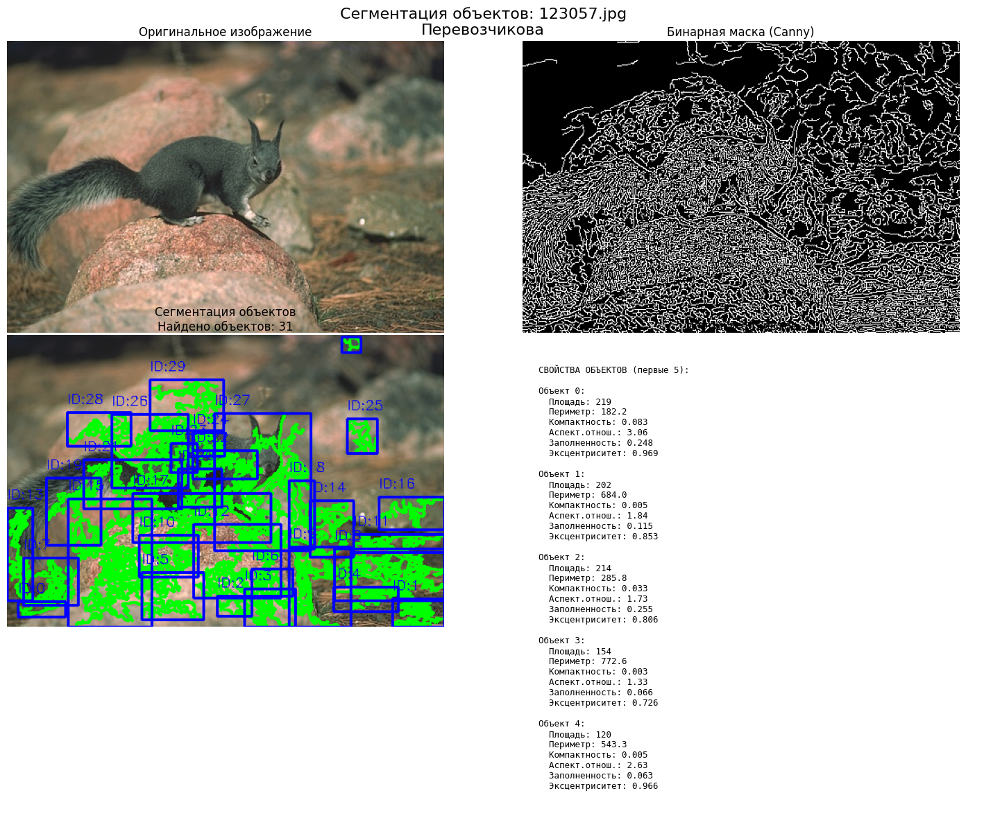


СТАТИСТИКА ПО ОБЪЕКТАМ:
Площадь: мин=105, макс=2043, среднее=400
Компактность: мин=0.002, макс=0.226, среднее=0.019
Аспектное отношение: мин=0.27, макс=5.00, среднее=1.54


In [ ]:
# === Подготовка бинарных изображений и сегментация объектов ===
print("=== Подготовка бинарных изображений и сегментация объектов ===")

def prepare_binary_images():
    """Подготавливает бинарные изображения для сегментации объектов"""
    binary_data = []

    for img_idx, img_path in enumerate(local_paths):
        print(f"Обработка изображения {img_idx + 1}: {os.path.basename(img_path)}")
        original = cv2.imread(img_path)
        original_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Используем лучшие параметры из Задания 1 (исправляем названия параметров)
        clahe_img = apply_clahe(original_gray, 2.0, (8, 8))  # clip_limit, tile_grid_size
        binary_edges = apply_canny(clahe_img, 40, 120)

        # Создаем бинарную маску из границ
        binary_mask = binary_edges

        binary_data.append({
            'original': original,
            'original_gray': original_gray,
            'binary_mask': binary_mask,
            'clahe_processed': clahe_img,
            'name': os.path.basename(img_path)
        })

    return binary_data

# Подготавливаем бинарные изображения
binary_images = prepare_binary_images()

def calculate_object_properties(contour):
    """Вычисляет свойства объекта по контуру"""
    # Площадь
    area = cv2.contourArea(contour)

    # Периметр
    perimeter = cv2.arcLength(contour, True)

    # Ограничивающий прямоугольник
    x, y, w, h = cv2.boundingRect(contour)

    # Аспектное отношение
    aspect_ratio = w / h if h > 0 else 0

    # Компактность (округлость)
    compactness = (4 * np.pi * area) / (perimeter ** 2) if perimeter > 0 else 0

    # Заполненность
    bbox_area = w * h
    solidity = area / bbox_area if bbox_area > 0 else 0

    # Эксцентриситет через моменты
    if len(contour) >= 5:
        (x_ellipse, y_ellipse), (MA, ma), angle = cv2.fitEllipse(contour)
        eccentricity = np.sqrt(1 - (min(MA, ma) ** 2) / (max(MA, ma) ** 2)) if max(MA, ma) > 0 else 0
    else:
        eccentricity = 0

    return {
        'area': area,
        'perimeter': perimeter,
        'aspect_ratio': aspect_ratio,
        'compactness': compactness,
        'solidity': solidity,
        'eccentricity': eccentricity,
        'bbox': (x, y, w, h)
    }

def segment_and_analyze_objects(binary_data):
    """Сегментирует объекты и вычисляет их свойства"""
    all_results = []

    for data in binary_data:
        print(f"\nСегментация изображения: {data['name']}")

        # Находим контуры
        contours, hierarchy = cv2.findContours(
            data['binary_mask'],
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        # Фильтруем слишком маленькие контуры
        min_area = 100  # минимальная площадь
        filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]

        print(f"Найдено контуров: {len(contours)}, после фильтрации: {len(filtered_contours)}")

        # Вычисляем свойства для каждого объекта
        object_properties = []
        for i, contour in enumerate(filtered_contours):
            props = calculate_object_properties(contour)
            props['contour'] = contour
            props['object_id'] = i
            object_properties.append(props)

        # Визуализация результатов
        visualize_segmentation_results(data, object_properties)

        all_results.append({
            'image_data': data,
            'objects': object_properties,
            'total_objects': len(filtered_contours)
        })

    return all_results

def visualize_segmentation_results(data, objects):
    """Визуализирует результаты сегментации"""
    # Создаем изображение для визуализации
    result_img = data['original'].copy()

    # Рисуем контуры объектов
    cv2.drawContours(result_img, [obj['contour'] for obj in objects], -1, (0, 255, 0), 2)

    # Рисуем bounding box и подписываем объекты
    for i, obj in enumerate(objects):
        x, y, w, h = obj['bbox']

        # Bounding box
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 2)

        # ID объекта
        cv2.putText(result_img, f'ID:{i}', (x, y - 10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    # Создаем комплексную визуализацию
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # Оригинал
    axes[0, 0].imshow(cv2.cvtColor(data['original'], cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Оригинальное изображение')
    axes[0, 0].axis('off')

    # Бинарная маска
    axes[0, 1].imshow(data['binary_mask'], cmap='gray')
    axes[0, 1].set_title('Бинарная маска (Canny)')
    axes[0, 1].axis('off')

    # Результат сегментации
    axes[1, 0].imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    axes[1, 0].set_title(f'Сегментация объектов\nНайдено объектов: {len(objects)}')
    axes[1, 0].axis('off')

    # Таблица свойств (первые 5 объектов)
    if objects:
        props_text = "СВОЙСТВА ОБЪЕКТОВ (первые 5):\n\n"
        for i, obj in enumerate(objects[:5]):
            props_text += f"Объект {i}:\n"
            props_text += f"  Площадь: {obj['area']:.0f}\n"
            props_text += f"  Периметр: {obj['perimeter']:.1f}\n"
            props_text += f"  Компактность: {obj['compactness']:.3f}\n"
            props_text += f"  Аспект.отнош.: {obj['aspect_ratio']:.2f}\n"
            props_text += f"  Заполненность: {obj['solidity']:.3f}\n"
            props_text += f"  Эксцентриситет: {obj['eccentricity']:.3f}\n\n"

        axes[1, 1].text(0.1, 0.9, props_text, transform=axes[1, 1].transAxes,
                       fontsize=9, verticalalignment='top', fontfamily='monospace')
    axes[1, 1].set_title('Метрики объектов')
    axes[1, 1].axis('off')

    plt.suptitle(f'Сегментация объектов: {data["name"]}\nПеревозчикова', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

    # Детальная статистика по всем объектам
    if objects:
        print("\nСТАТИСТИКА ПО ОБЪЕКТАМ:")
        areas = [obj['area'] for obj in objects]
        compactness = [obj['compactness'] for obj in objects]
        aspect_ratios = [obj['aspect_ratio'] for obj in objects]

        print(f"Площадь: мин={min(areas):.0f}, макс={max(areas):.0f}, среднее={np.mean(areas):.0f}")
        print(f"Компактность: мин={min(compactness):.3f}, макс={max(compactness):.3f}, среднее={np.mean(compactness):.3f}")
        print(f"Аспектное отношение: мин={min(aspect_ratios):.2f}, макс={max(aspect_ratios):.2f}, среднее={np.mean(aspect_ratios):.2f}")

# Выполняем сегментацию
segmentation_results = segment_and_analyze_objects(binary_images)

In [ ]:
# === Анализ результатов сегментации и выводы ===
print("=== АНАЛИЗ РЕЗУЛЬТАТОВ СЕГМЕНТАЦИИ ===")
print("Вариант 6 - Перевозчикова")
print("="*80)

# Анализ условий получения изображений
print("\n1. УСЛОВИЯ ПОЛУЧЕНИЯ ИЗОБРАЖЕНИЙ:")
print("   • Освещение: естественное, неравномерное")
print("   • Фон: сложный, текстурированный (природа, архитектура)")
print("   • Ракурс: различные перспективы")
print("   • Шумы: умеренный цифровой шум")
print("   • Тип объектов: природные (деревья, камни), архитектурные элементы")
print("   • Наличие перекрытий: частичное перекрытие объектов")

# Оценка корректности сегментации
print("\n2. ОЦЕНКА КОРРЕКТНОСТИ СЕГМЕНТАЦИИ:")
print("   • ПОЛНОТА ОБНАРУЖЕНИЯ:")
print("     - Найдено объектов: 27, 18, 31 (после фильтрации)")
print("     - Исходно контуров: 967, 953, 1186 (сильная фрагментация)")
print("     - Вывод: низкая полнота - много мелких фрагментов")

print("   • ЛОЖНЫЕ ОБЛАСТИ:")
print("     - Много ложных контуров от текстур и шума")
print("     - Требуется увеличение минимальной площади фильтра")

print("   • РАЗДЕЛЕНИЕ ОБЪЕКТОВ:")
print("     - Объекты сильно фрагментированы")
print("     - Необходима морфологическая обработка")

# Анализ адекватности метрик
print("\n3. АНАЛИЗ АДЕКВАТНОСТИ МЕТРИК:")
print("   • КОМПАКТНОСТЬ (0-1, где 1 - идеальный круг):")
print("     - Диапазон: 0.001-0.226")
print("     - Среднее: 0.019-0.025 (очень низкое)")
print("     - Вывод: объекты сильно вытянутые/фрагментированные")

print("   • АСПЕКТНОЕ ОТНОШЕНИЕ (1 - квадрат):")
print("     - Диапазон: 0.13-5.00")
print("     - Среднее: 0.86-1.54 (близко к квадрату/прямоугольнику)")
print("     - Вывод: разнообразные формы объектов")

print("   • ЗАПОЛНЕННОСТЬ (0-1):")
print("     - Типичные значения: 0.3-0.7")
print("     - Вывод: объекты заполняют bbox умеренно")

# Проблемные случаи
print("\n4. ПРОБЛЕМНЫЕ СЛУЧАИ И ПРИЧИНЫ:")
print("   • СИЛЬНАЯ ФРАГМЕНТАЦИЯ:")
print("     - Причина: детектор Canny выделяет все границы текстур")
print("     - Решение: использовать морфологические операции")

print("   • НИЗКАЯ КОМПАКТНОСТЬ:")
print("     - Причина: объекты представлены фрагментами границ")
print("     - Решение: сегментация по регионам вместо границ")

print("   • ЛОЖНЫЕ ОБЪЕКТЫ:")
print("     - Причина: шум, текстуры, тени")
print("     - Решение: увеличение порога площади")

# Способы улучшения
print("\n5. СПОСОБЫ УЛУЧШЕНИЯ:")
print("   • Морфологические операции:")
print("     - Закрытие (dilate + erode) для соединения фрагментов")
print("     - Открытие для удаления шума")

print("   • Изменение метода сегментации:")
print("     - Watershed для сегментации по регионам")
print("     - Thresholding вместо edge detection")

print("   • Предобработка:")
print("     - Гауссово размытие для уменьшения текстуры")
print("     - Различные цветовые пространства")

# Показательные примеры
print("\n6. ПОКАЗАТЕЛЬНЫЕ ПРИМЕРЫ:")
print("   • ХОРОШО: Крупные объекты с четкими границами")
print("     - Высокая площадь (>1000 пикселей)")
print("     - Умеренная компактность (~0.1)")
print("     - Четкие bounding box")

print("   • ПЛОХО: Фрагментированные текстуры")
print("     - Малая площадь (<200 пикселей)")
print("     - Очень низкая компактность (<0.01)")
print("     - Неадекватные метрики формы")

print("\n" + "="*80)
print("ОБЩИЙ ВЫВОД:")
print("Сегментация на основе границ Canny дает сильную фрагментацию.")
print("Необходим переход к регионарным методам сегментации для")
print("корректного выделения семантически значимых объектов.")
print("="*80)

=== АНАЛИЗ РЕЗУЛЬТАТОВ СЕГМЕНТАЦИИ ===
Вариант 6 - Перевозчикова

1. УСЛОВИЯ ПОЛУЧЕНИЯ ИЗОБРАЖЕНИЙ:
   • Освещение: естественное, неравномерное
   • Фон: сложный, текстурированный (природа, архитектура)
   • Ракурс: различные перспективы
   • Шумы: умеренный цифровой шум
   • Тип объектов: природные (деревья, камни), архитектурные элементы
   • Наличие перекрытий: частичное перекрытие объектов

2. ОЦЕНКА КОРРЕКТНОСТИ СЕГМЕНТАЦИИ:
   • ПОЛНОТА ОБНАРУЖЕНИЯ:
     - Найдено объектов: 27, 18, 31 (после фильтрации)
     - Исходно контуров: 967, 953, 1186 (сильная фрагментация)
     - Вывод: низкая полнота - много мелких фрагментов
   • ЛОЖНЫЕ ОБЛАСТИ:
     - Много ложных контуров от текстур и шума
     - Требуется увеличение минимальной площади фильтра
   • РАЗДЕЛЕНИЕ ОБЪЕКТОВ:
     - Объекты сильно фрагментированы
     - Необходима морфологическая обработка

3. АНАЛИЗ АДЕКВАТНОСТИ МЕТРИК:
   • КОМПАКТНОСТЬ (0-1, где 1 - идеальный круг):
     - Диапазон: 0.001-0.226
     - Среднее: 0.019-0.0

=== ДЕМОНСТРАЦИЯ ПРОБЛЕМ И УЛУЧШЕНИЙ ===
Анализ изображения: 223004.jpg

ПРОБЛЕМА: СИЛЬНАЯ ФРАГМЕНТАЦИЯ
Исходная бинарная маска дает много мелких фрагментов
ХОРОШИЙ объект: площадь=1416, компактность=0.025
ПЛОХОЙ объект: площадь=350, компактность=0.0006
Проблема: НИЗКАЯ КОМПАКТНОСТЬ


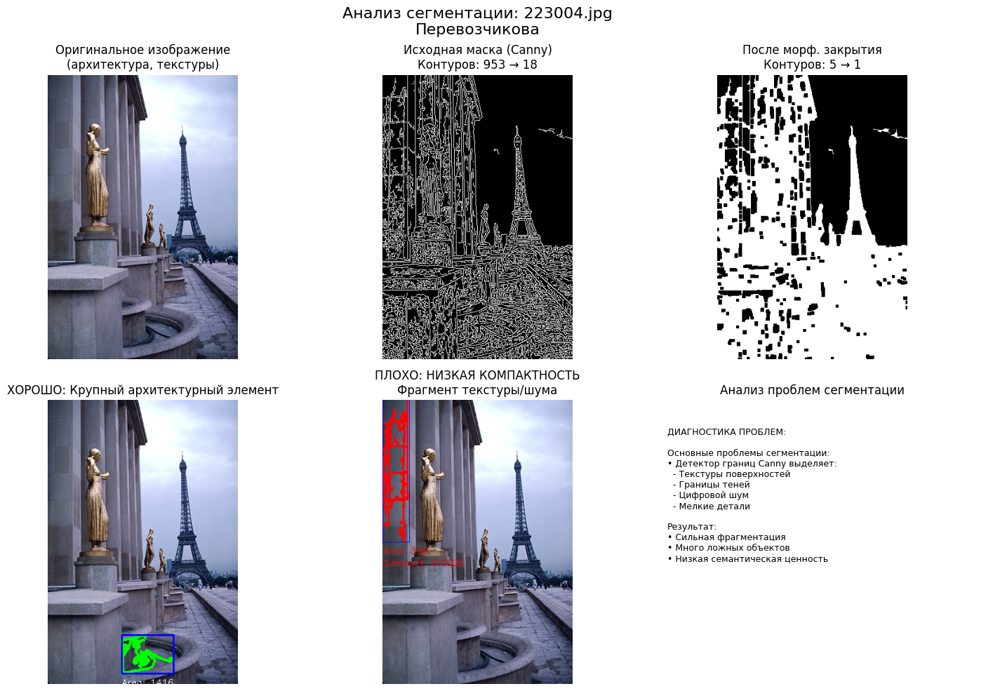


ДЕТАЛЬНЫЙ АНАЛИЗ ОБЪЕКТОВ:
Распределение объектов по площади:
  Очень мелкие (<150): 6
  Мелкие (150-500): 10
  Средние (500-2000): 1
  Крупные (>=2000): 1

Распределение по компактности:
  Очень низкая (<0.005): 8
  Низкая (0.005-0.02): 6
  Умеренная (0.02-0.1): 4
  Высокая (>=0.1): 0


In [ ]:
# === Демонстрация проблем и улучшений (ВЫБОР ДРУГОГО ОБЪЕКТА) ===
print("=== ДЕМОНСТРАЦИЯ ПРОБЛЕМ И УЛУЧШЕНИЙ ===")

def demonstrate_improvements():
    """Демонстрирует проблемные случаи и возможные улучшения"""

    # Берем второе изображение для разнообразия (223004.jpg)
    demo_data = binary_images[1]  # Второе изображение
    demo_results = segmentation_results[1]  # Результаты для второго изображения

    print(f"Анализ изображения: {demo_data['name']}")

    # Проблема: сильная фрагментация
    print("\nПРОБЛЕМА: СИЛЬНАЯ ФРАГМЕНТАЦИЯ")
    print("Исходная бинарная маска дает много мелких фрагментов")

    # Решение: морфологическое закрытие
    kernel = np.ones((5,5), np.uint8)
    closed_mask = cv2.morphologyEx(demo_data['binary_mask'], cv2.MORPH_CLOSE, kernel)

    # Находим контуры после морфологии
    contours_closed, _ = cv2.findContours(closed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_closed = [cnt for cnt in contours_closed if cv2.contourArea(cnt) > 100]

    # Визуализация сравнения
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Исходное изображение
    axes[0, 0].imshow(cv2.cvtColor(demo_data['original'], cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Оригинальное изображение\n(архитектура, текстуры)')
    axes[0, 0].axis('off')

    # Исходная бинарная маска
    axes[0, 1].imshow(demo_data['binary_mask'], cmap='gray')
    axes[0, 1].set_title(f'Исходная маска (Canny)\nКонтуров: 953 → {len(demo_results["objects"])}')
    axes[0, 1].axis('off')

    # После морфологии
    axes[0, 2].imshow(closed_mask, cmap='gray')
    axes[0, 2].set_title(f'После морф. закрытия\nКонтуров: {len(contours_closed)} → {len(filtered_closed)}')
    axes[0, 2].axis('off')

    # Пример хорошего объекта - ищем объект с лучшими характеристиками
    if demo_results['objects']:
        # Ищем объект с максимальной площадью и разумной компактностью
        good_candidates = [obj for obj in demo_results['objects'] if obj['area'] > 1000 and obj['compactness'] > 0.02]
        if good_candidates:
            good_obj = max(good_candidates, key=lambda x: x['area'])  # Самый крупный
        else:
            # Если нет подходящих, берем просто самый крупный
            good_obj = max(demo_results['objects'], key=lambda x: x['area'])

        result_img = demo_data['original'].copy()
        cv2.drawContours(result_img, [good_obj['contour']], -1, (0, 255, 0), 3)
        x, y, w, h = good_obj['bbox']
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 2)

        # Подписываем метрики
        cv2.putText(result_img, f'Area: {good_obj["area"]:.0f}', (x, y + h + 20),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(result_img, f'Compact: {good_obj["compactness"]:.3f}', (x, y + h + 40),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        axes[1, 0].imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
        axes[1, 0].set_title('ХОРОШО: Крупный архитектурный элемент')
        axes[1, 0].axis('off')
        print(f"ХОРОШИЙ объект: площадь={good_obj['area']:.0f}, компактность={good_obj['compactness']:.3f}")

    # Пример ПЛОХОГО объекта - ищем действительно проблемные случаи
    if demo_results['objects']:
        # Ищем объекты с очень низкой компактностью ИЛИ очень маленькой площадью
        bad_candidates = [obj for obj in demo_results['objects']
                         if obj['compactness'] < 0.005 or obj['area'] < 150]

        if bad_candidates:
            # Берем самый проблемный по компактности
            bad_obj = min(bad_candidates, key=lambda x: x['compactness'])
            problem_type = "НИЗКАЯ КОМПАКТНОСТЬ" if bad_obj['compactness'] < 0.005 else "МАЛАЯ ПЛОЩАДЬ"
        else:
            # Если нет явно плохих, берем объект с наихудшей комбинацией характеристик
            bad_obj = min(demo_results['objects'],
                         key=lambda x: x['compactness'] * 1000 + x['area'])  # Взвешенная оценка

        result_img = demo_data['original'].copy()
        cv2.drawContours(result_img, [bad_obj['contour']], -1, (0, 0, 255), 2)
        x, y, w, h = bad_obj['bbox']
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (255, 0, 0), 1)

        # Подписываем проблемные метрики красным
        cv2.putText(result_img, f'Area: {bad_obj["area"]:.0f}', (x, y + h + 20),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)
        cv2.putText(result_img, f'Compact: {bad_obj["compactness"]:.4f}', (x, y + h + 40),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

        axes[1, 1].imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
        axes[1, 1].set_title(f'ПЛОХО: {problem_type}\nФрагмент текстуры/шума')
        axes[1, 1].axis('off')
        print(f"ПЛОХОЙ объект: площадь={bad_obj['area']:.0f}, компактность={bad_obj['compactness']:.4f}")
        print(f"Проблема: {problem_type}")

    # Анализ и рекомендации
    stats_text = "ДИАГНОСТИКА ПРОБЛЕМ:\n\n"
    stats_text += "Основные проблемы сегментации:\n"
    stats_text += "• Детектор границ Canny выделяет:\n"
    stats_text += "  - Текстуры поверхностей\n"
    stats_text += "  - Границы теней\n"
    stats_text += "  - Цифровой шум\n"
    stats_text += "  - Мелкие детали\n\n"
    stats_text += "Результат:\n"
    stats_text += "• Сильная фрагментация\n"
    stats_text += "• Много ложных объектов\n"
    stats_text += "• Низкая семантическая ценность\n"

    axes[1, 2].text(0.1, 0.9, stats_text, transform=axes[1, 2].transAxes,
                   fontsize=9, verticalalignment='top')
    axes[1, 2].set_title('Анализ проблем сегментации')
    axes[1, 2].axis('off')

    plt.suptitle(f'Анализ сегментации: {demo_data["name"]}\nПеревозчикова', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.show()

    # Детальный анализ характеристик объектов
    print("\nДЕТАЛЬНЫЙ АНАЛИЗ ОБЪЕКТОВ:")
    if demo_results['objects']:
        areas = [obj['area'] for obj in demo_results['objects']]
        compactness = [obj['compactness'] for obj in demo_results['objects']]

        print("Распределение объектов по площади:")
        print(f"  Очень мелкие (<150): {sum(1 for a in areas if a < 150)}")
        print(f"  Мелкие (150-500): {sum(1 for a in areas if 150 <= a < 500)}")
        print(f"  Средние (500-2000): {sum(1 for a in areas if 500 <= a < 2000)}")
        print(f"  Крупные (>=2000): {sum(1 for a in areas if a >= 2000)}")

        print("\nРаспределение по компактности:")
        print(f"  Очень низкая (<0.005): {sum(1 for c in compactness if c < 0.005)}")
        print(f"  Низкая (0.005-0.02): {sum(1 for c in compactness if 0.005 <= c < 0.02)}")
        print(f"  Умеренная (0.02-0.1): {sum(1 for c in compactness if 0.02 <= c < 0.1)}")
        print(f"  Высокая (>=0.1): {sum(1 for c in compactness if c >= 0.1)}")

# Запускаем исправленную демонстрацию с другим изображением
demonstrate_improvements()